In [5]:
#importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,f1_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import joblib
import warnings
warnings.filterwarnings('ignore')

In [2]:
#displating max_rows
pd.set_option('display.max_rows',100,'display.max_columns',None)

In [6]:
#importing dataset
df=pd.read_csv('Avocado.csv')
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


# considering the target variable as region ,lets work on Classification problem

In [4]:
df.shape

(18249, 14)

there are 18249 rows and 14 columns in the dataset

we are able to see region,Date,type as categorical data and


In [5]:
df.Date.nunique()

169

we are able to observe 169 unique values in the dataset

In [7]:
df["month"] = pd.to_datetime(df.Date, format="%Y/%m/%d").dt.month

In [8]:
df["Day"] = pd.to_datetime(df.Date, format="%Y/%m/%d").dt.day

we are going to drop 'unnamed' column as it has no relation with the model,and we can drop the column Date now since we splitted the Date column to month and Day and Year column is already present in the dataset as it is unnecessary

In [9]:
#dropping 'unnamed' and 'Date' data from the dataset
df.drop(columns=["Date"],axis=1,inplace=True)

In [9]:
#updated Dataset shape
df.shape

(18249, 15)

we have 14 columns in the dataset now,the number of rows remains unchanged .

In [10]:
df['type'].value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

In [11]:
df['type'].nunique()

2

In [12]:
df['year'].value_counts()

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64

we are able to see in the year 2017 we have 5722 data and 2016 we have 5616 data and 2015 we have 5615 data and and 2018 we have 1296 data 

In [13]:
df['year'].nunique()

4

In [14]:
#lets check for duplicates in the dataset 
df.drop_duplicates(inplace=True)
df.shape

(18249, 15)

There are no duplicates in the dataset

# Missing values

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 18248
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
 13  month         18249 non-null  int64  
 14  Day           18249 non-null  int64  
dtypes: float64(9), int64(4), object(2)
memory usage: 2.2+ MB


In [16]:
#checking the availabel null values in the dataset 
df.isnull().sum()

Unnamed: 0      0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
month           0
Day             0
dtype: int64

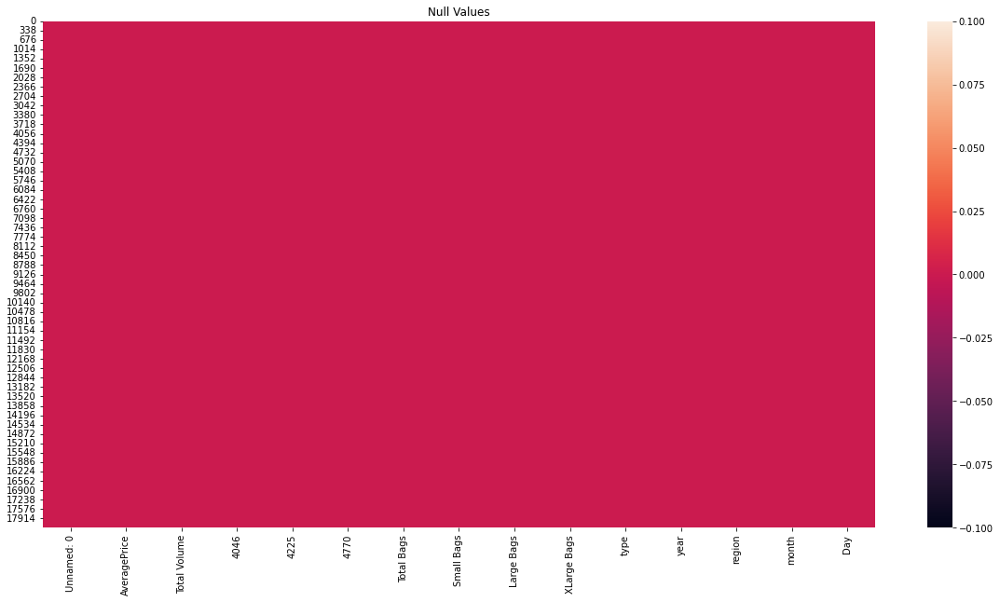

In [17]:
#heatmap on null values
plt.figure(figsize=[20,10])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

there are no whitespaces or null values present in the dataset so we can continue with the dataset
as we have non null values equal to same no of available rows in the dataset

# Statistics summary

In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,18249.0,24.232232,1.548104e+01,0.00,10.00,24.00,38.00,52.00
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65


In [19]:
df['region'].nunique()

54

In [20]:
df['region'].value_counts()

Albany                 338
Sacramento             338
Northeast              338
NorthernNewEngland     338
Orlando                338
Philadelphia           338
PhoenixTucson          338
Pittsburgh             338
Plains                 338
Portland               338
RaleighGreensboro      338
RichmondNorfolk        338
Roanoke                338
SanDiego               338
Atlanta                338
SanFrancisco           338
Seattle                338
SouthCarolina          338
SouthCentral           338
Southeast              338
Spokane                338
StLouis                338
Syracuse               338
Tampa                  338
TotalUS                338
West                   338
NewYork                338
NewOrleansMobile       338
Nashville              338
Midsouth               338
BaltimoreWashington    338
Boise                  338
Boston                 338
BuffaloRochester       338
California             338
Charlotte              338
Chicago                338
C

we are able to observe all the regions except WestTexNewMexico is of same counts

In [22]:
color_list=['green','purple','red','blue','black','Orange','violet','pink','yellow']

Text(0.5, 1.0, 'region')

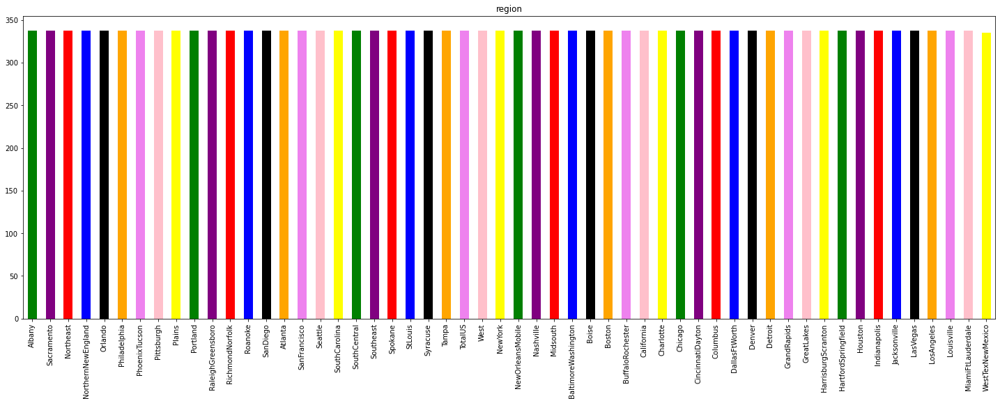

In [23]:
plt.figure(figsize=(25,8))
pd.value_counts(df.region).plot.bar(color=color_list)
plt.title("region")

<AxesSubplot:ylabel='None'>

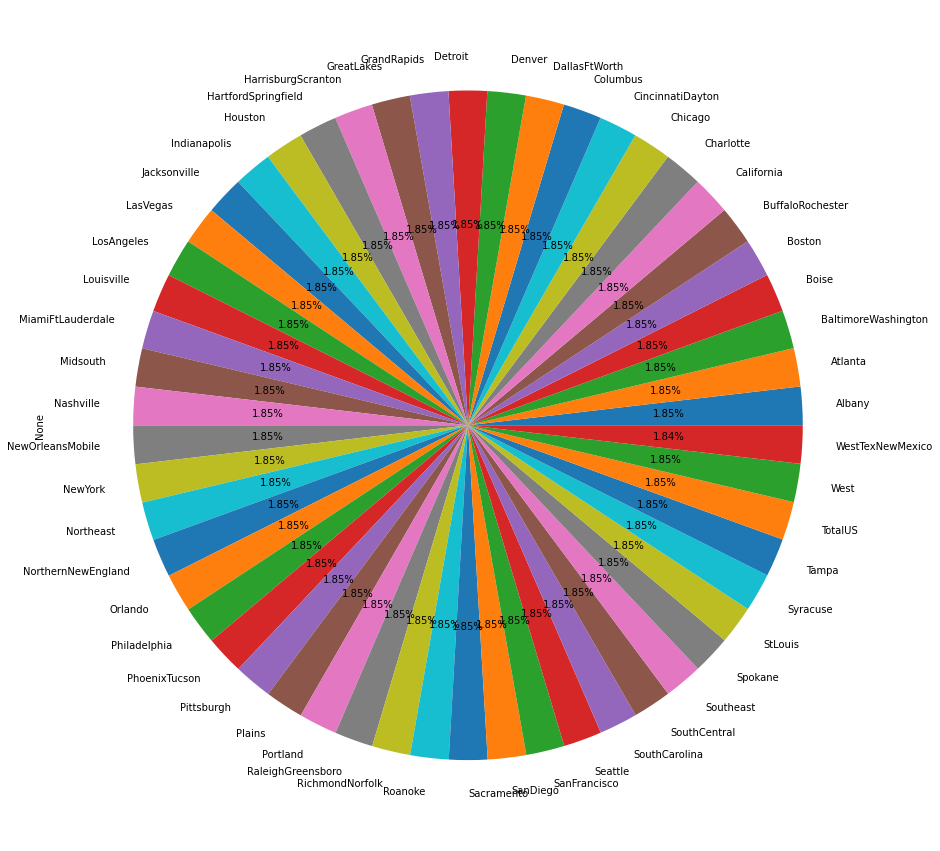

In [24]:
plt.figure(figsize=(15,25))

df.groupby("region").size().plot(kind='pie',autopct='%.2f%%')

we are able to each class in region is equally distributed.

# we can see that the dataset is balanced and so we can continue with the current format

<AxesSubplot:>

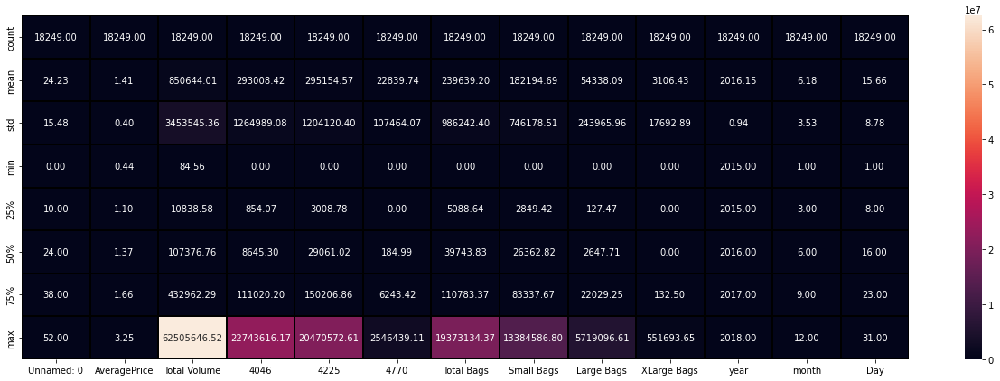

In [25]:
plt.figure(figsize=(22,7))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

# Encoding

In [10]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()

In [11]:
df.type=LE.fit_transform(df.type)

In [12]:
df.region=LE.fit_transform(df.region)

successfully encoded the category datatypes

# Data Visualization

lets visualise the dataset

In [29]:
columns=df.columns

In [30]:
def hist_plt(i):
    plt.figure(figsize=(10,5))
    
    sns.histplot(x=columns[i],data=df,kde=True)

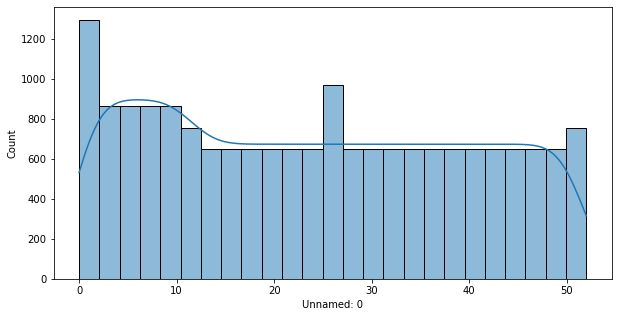

In [31]:
hist_plt(0)

we are able to observe equal distribution of data in the dataset.in almost all the parts we can more than 600+ count in each sections.

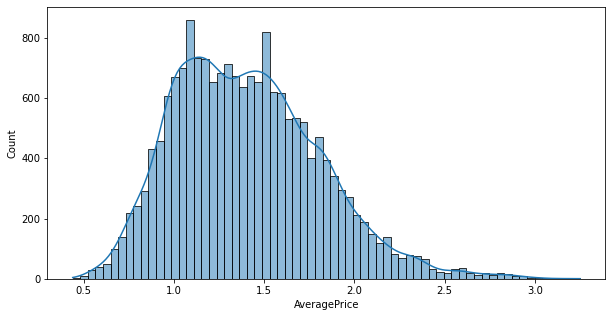

In [32]:
hist_plt(1)

we are able to see uniform data distribution in the dataset and in the range of 1 to 1.5 we have data with 700 and we can see the reduction in the data with increase in average price.

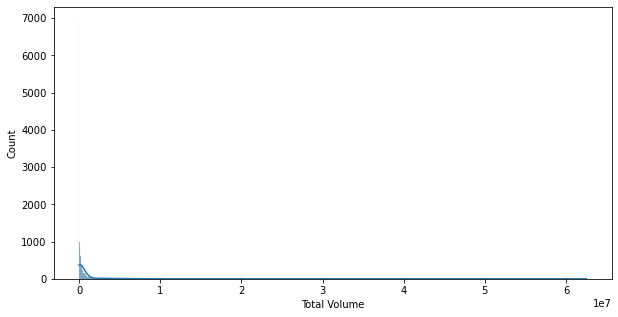

In [33]:
hist_plt(2)

we are able to see large distribution in total volume and count is high in zero.

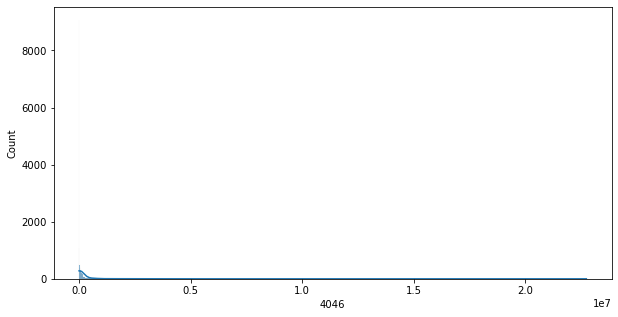

In [34]:
hist_plt(3)

we are able to see large distribution in 4046  and count is high in zero

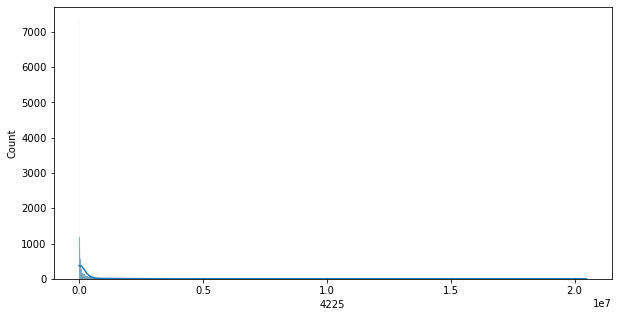

In [35]:
hist_plt(4)

we are able to see large distribution in 4225 and count is high in zero

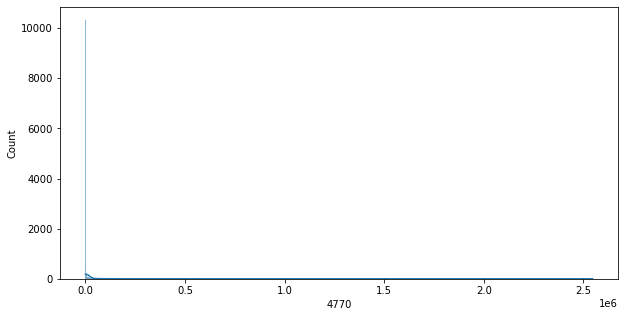

In [36]:
hist_plt(5)

we are able to see large distribution in 4770 and count is high in zero from the rest of the dataset

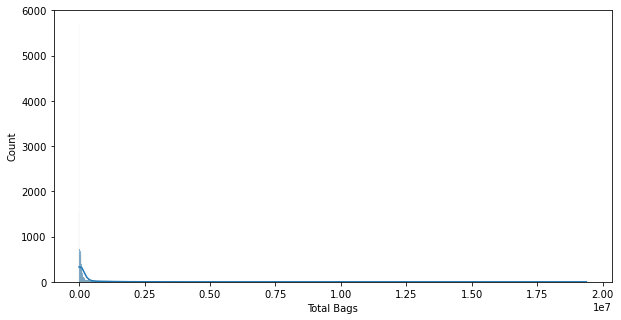

In [37]:
hist_plt(6)

we are able to see large distribution in total Bags and count is high in zero

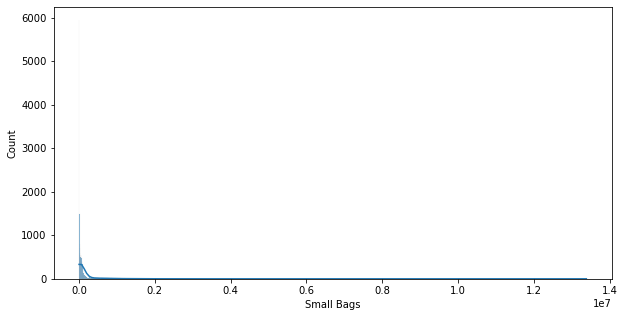

In [38]:
hist_plt(7)

we are able to see large distribution in small bags and count is high in zero

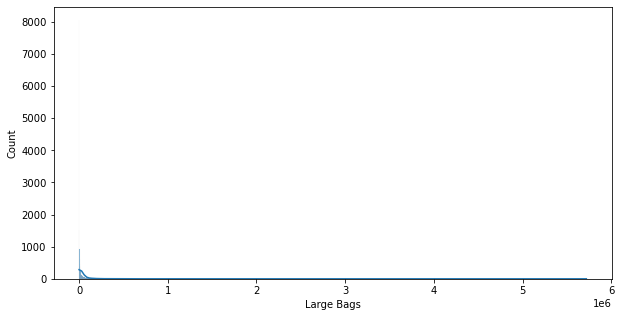

In [39]:
hist_plt(8)

we are able to see large distribution in Large bags and count is high in zero

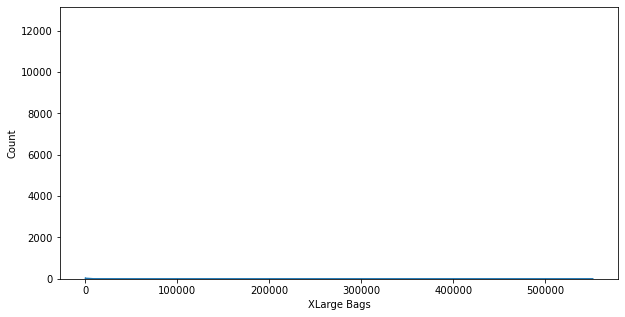

In [40]:
hist_plt(9)

we are able to see large distribution in XlargeBags .

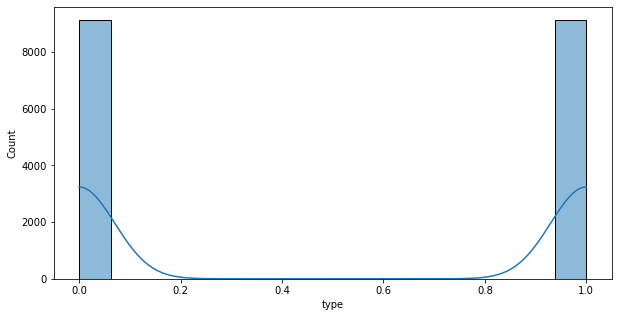

In [41]:
hist_plt(10)

we are able to for each type we can see equal count in the each classes

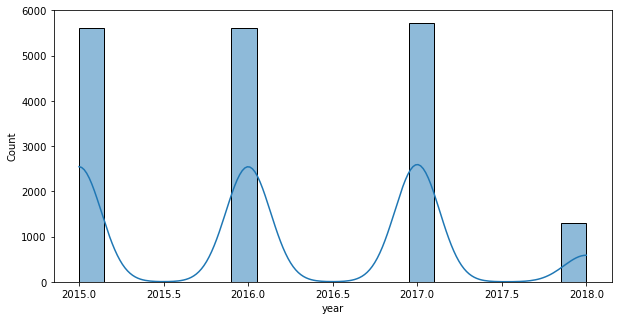

In [42]:
hist_plt(11)

in the year column we are able to see except the year 2018(less than 2000) we have large no of data almost equal (above 5000) in the other classes in the dataset.

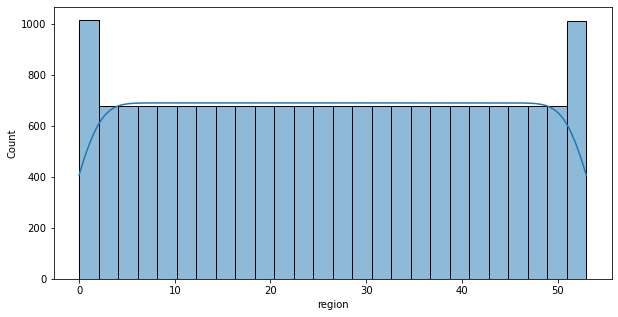

In [43]:
hist_plt(12)

we are able to see except 2 regions we are able to see same proportion of data in the dataset and the difference is small.

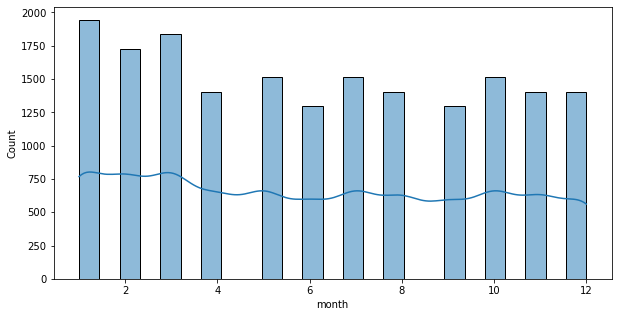

In [44]:
hist_plt(13)

we are able to see that there is uneven trend in the dataset for each of the months .

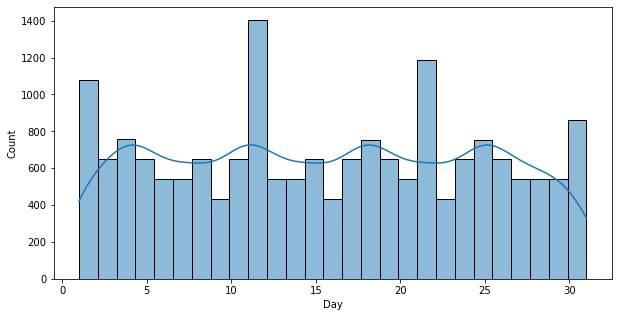

In [45]:
hist_plt(14)

we are able to see a high count of data in the 11th and 21st and 1st and 31st of each month  in the given dataset

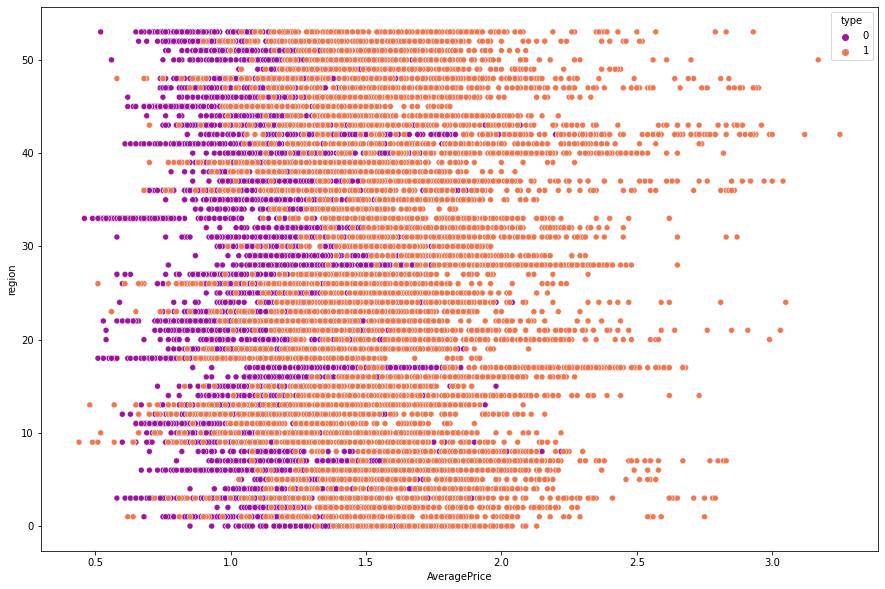

In [46]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='AveragePrice', y='region', hue='type', data=df, palette="plasma")
plt.show()

we are able to see a large portion of the dataset is on organic type and less in conventional type.as the average price increases we can see a trend in increase in the 
organic type compared to conventional datatype.we can see that for each region even with avgprice increase in the regions for  more in the organic compared to conventional

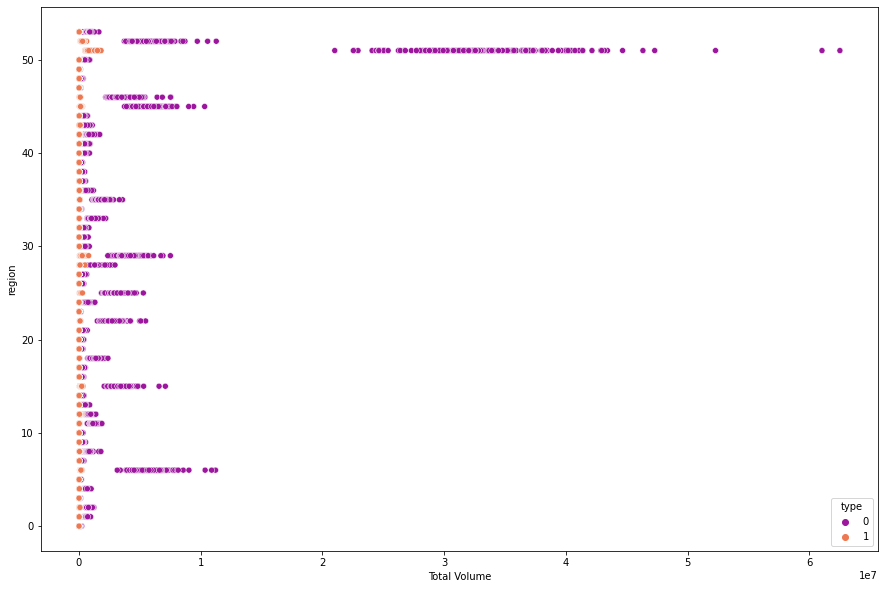

In [47]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Total Volume', y='region', hue='type', data=df, palette="plasma")
plt.show()

the total volume is getting more datapoints at zero on organic but there is no change with increase in sales  and we can see increase in the total volume on each region iin conventional past zero unit.

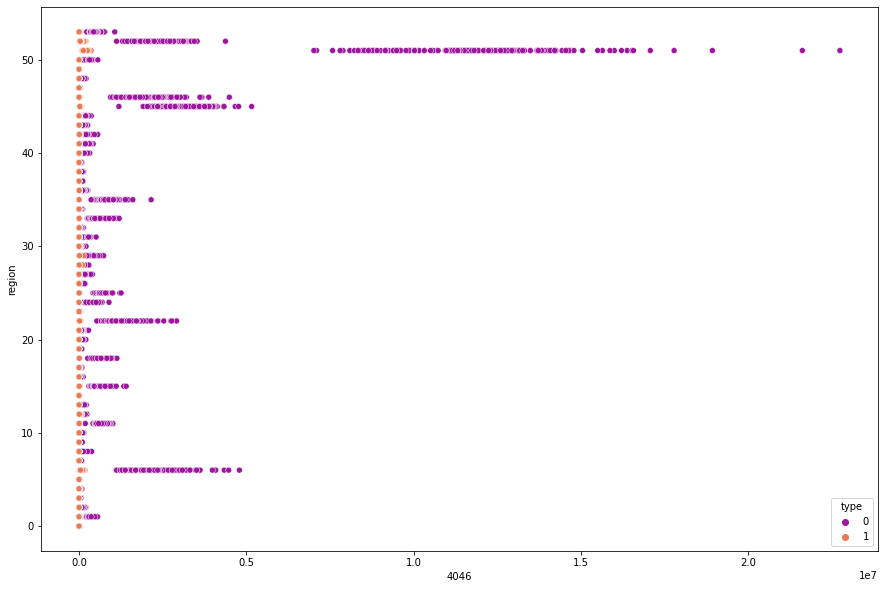

In [48]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4046', y='region', hue='type', data=df, palette="plasma")
plt.show()

the 4046 plu sale is getting more datapoints at zero on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

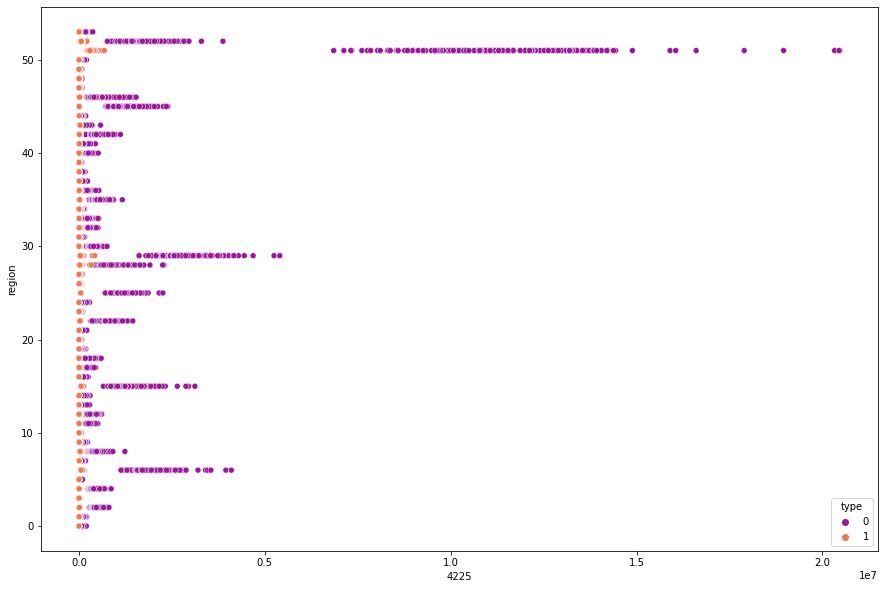

In [49]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4225', y='region', hue='type', data=df, palette="plasma")
plt.show()

the 4225 plu sale is getting more datapoints at zero unit on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

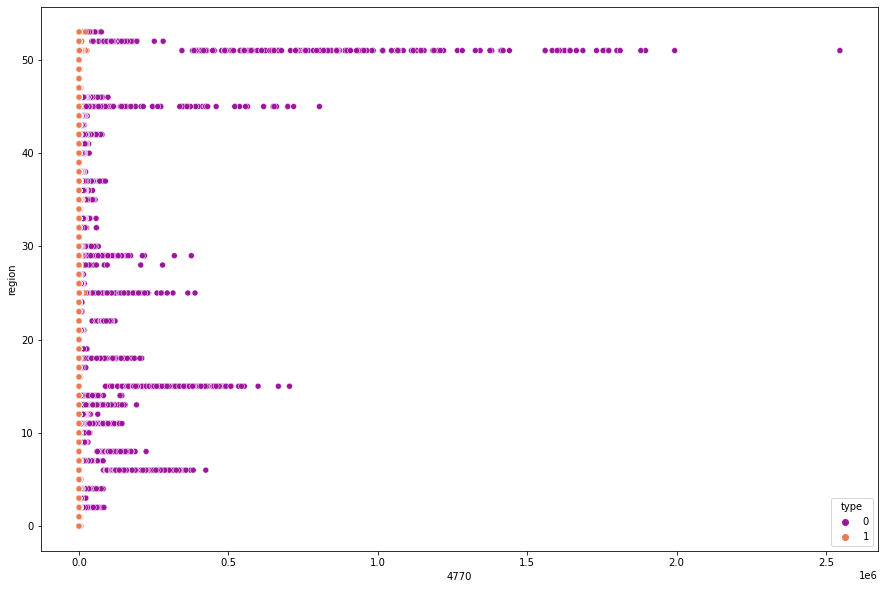

In [50]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4770', y='region', hue='type', data=df, palette="plasma")
plt.show()

the 4770 plu sale is getting more datapoints at zero on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

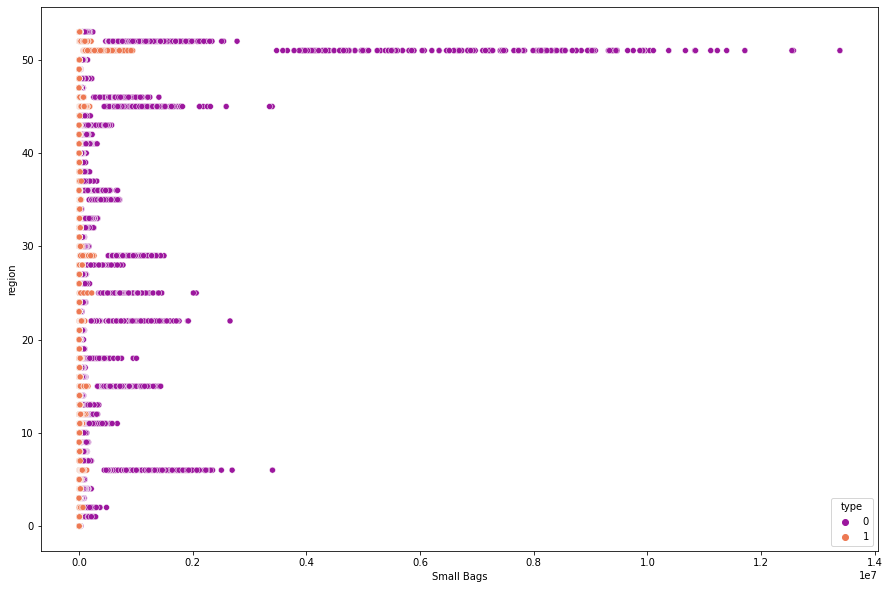

In [51]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Small Bags', y='region', hue='type', data=df, palette="plasma")
plt.show()

in the small bags , is getting more datapoints at zero on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

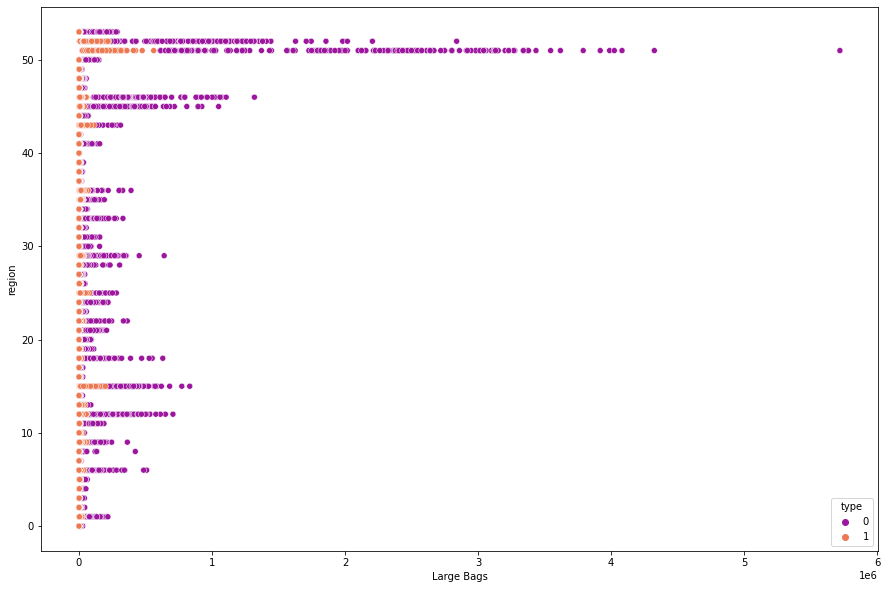

In [52]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Large Bags', y='region', hue='type', data=df, palette="plasma")
plt.show()

in the large bags , getting more datapoints at zero on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

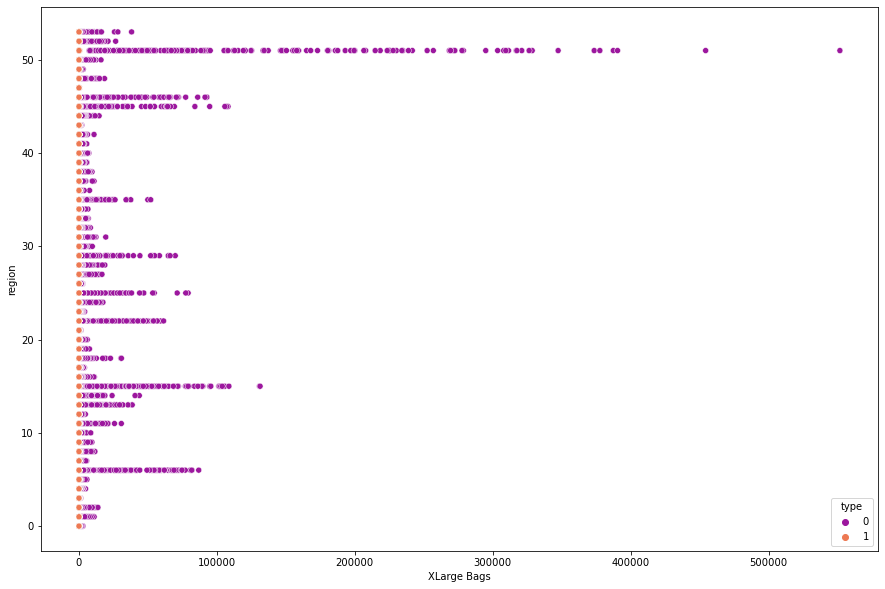

In [53]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='XLarge Bags', y='region', hue='type', data=df, palette="plasma")
plt.show()

in the Xlarge bags , getting more datapoints at zero on organic but there is no change with increase in sales and we can see increase in the total volume on each region iin conventional past zero unit

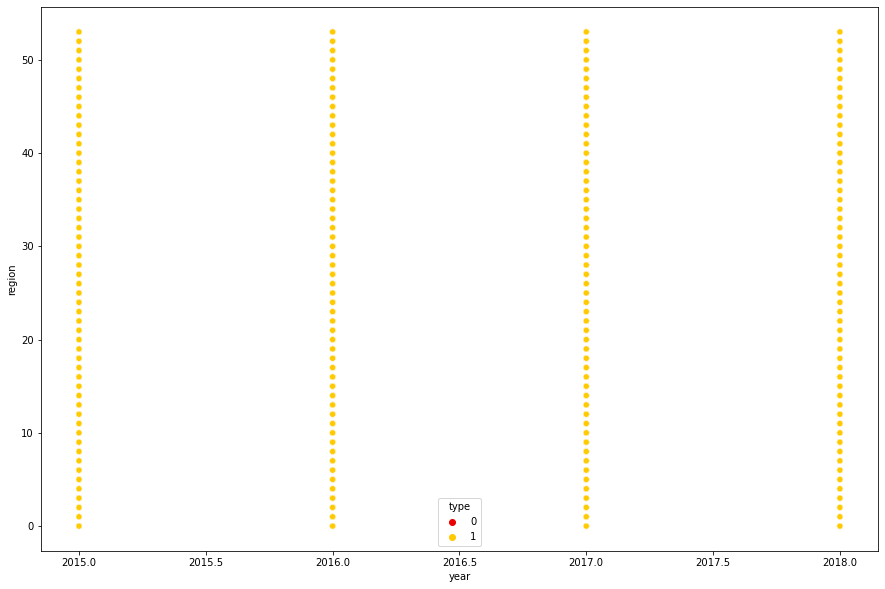

In [54]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='year', y='region', hue='type', data=df, palette="hot")
plt.show()

for  each regions of classes we are able to see large data on each year for organic type compared to the conventional type.

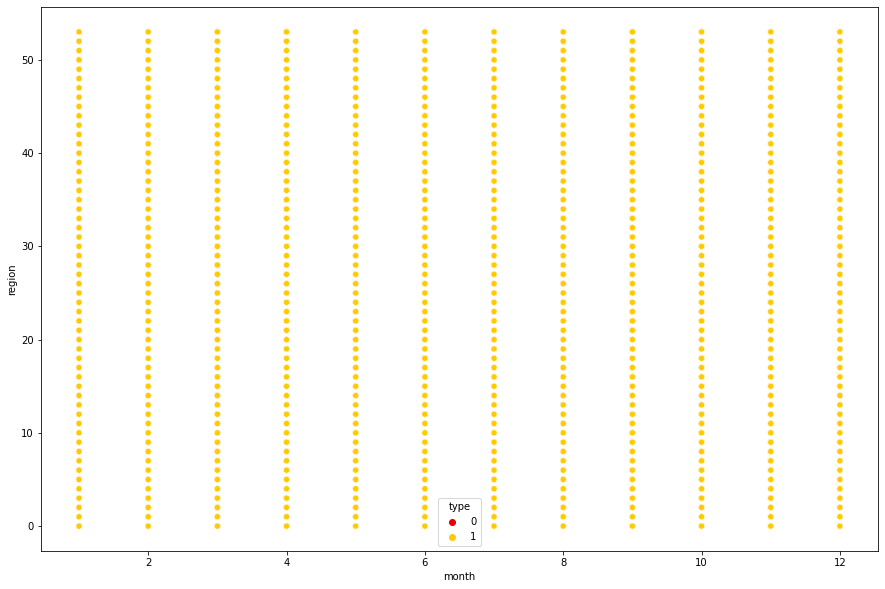

In [55]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='month', y='region', hue='type', data=df, palette="hot")
plt.show()

for  each regions of classes we are able to see large data on each month for organic type compared to the conventional type.so most preffered wiil be for organic in the sales.so most preffered wiil be for organic in the sales

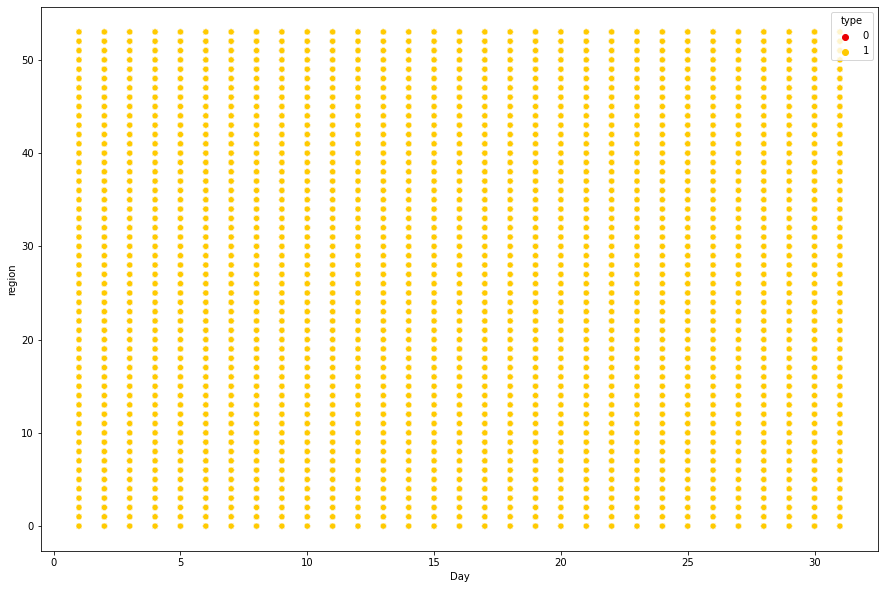

In [56]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Day', y='region', hue='type', data=df, palette="hot")
plt.show()

for each regions of classes we are able to see large data on each day for organic type compared to the conventional type.so most preffered wiil be for organic in the sales.so most preffered wiil be for organic in the sales

In [57]:
#relational plot between region and each features
def pplot(i):
    plt.figure(figsize=(10,9))
    sns.regplot(x=columns[i],y='region',data=df)    
    plt.xlabel(columns[i])
    plt.show()

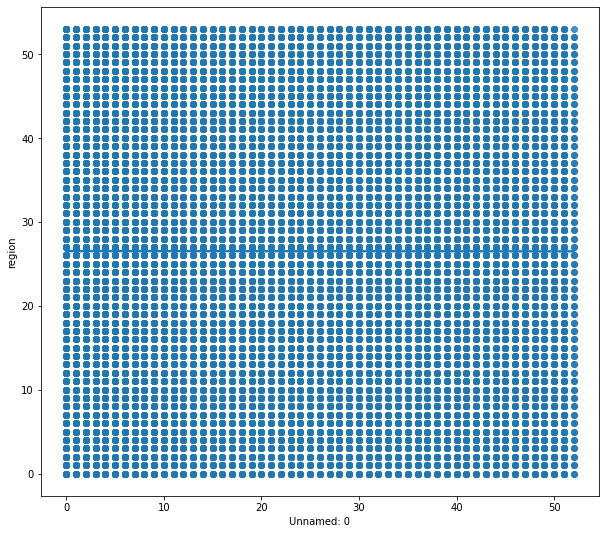

In [58]:
pplot(0)

we are able to see any linear relation between the region and unnamed column here.

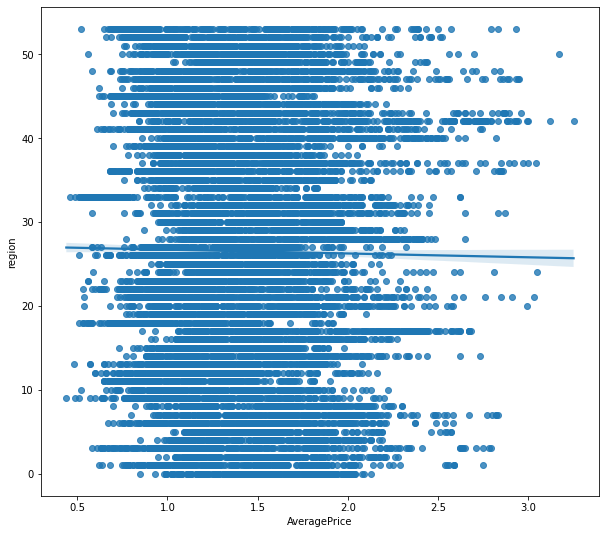

In [59]:
pplot(1)

we are able to see a slight inverse relation between the regions and the avgprice .We can see the data is more in 0.6 to 2,4 compared to the rest .there is a decrease in the regions dataset with increase in average price

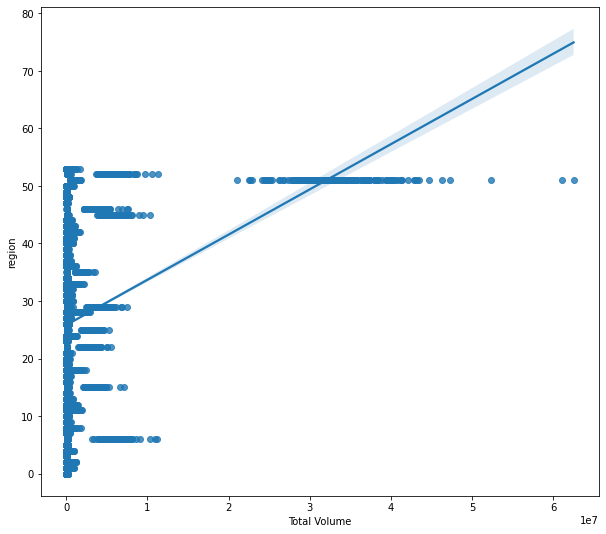

In [60]:
pplot(2)

we are able to see positive linear relationship between the total volume and regions.the data is more denser at totla volume is on range of zero to 1  unit and as the total volume increase we are able to see increase in the datapoints in the regions as well

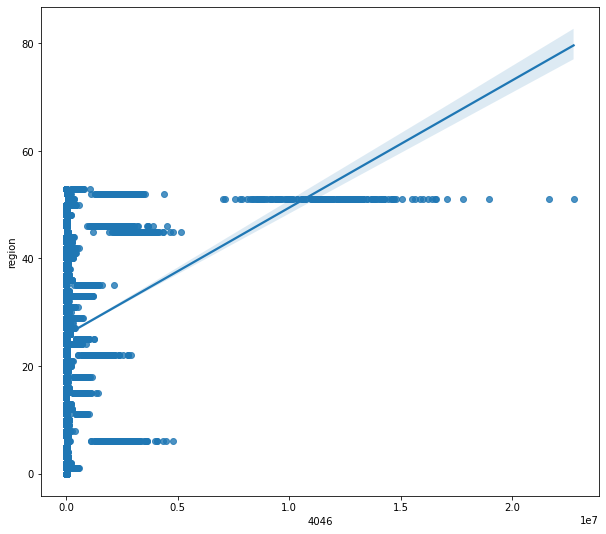

In [61]:
pplot(3)

we are able to see positive linear relationship between the 4046 plu sale and regions.the data is more denser at plu sale is on range of zero to 0.5  unit and as the total volume increase we are able to see increase in the datapoints in the regions as well

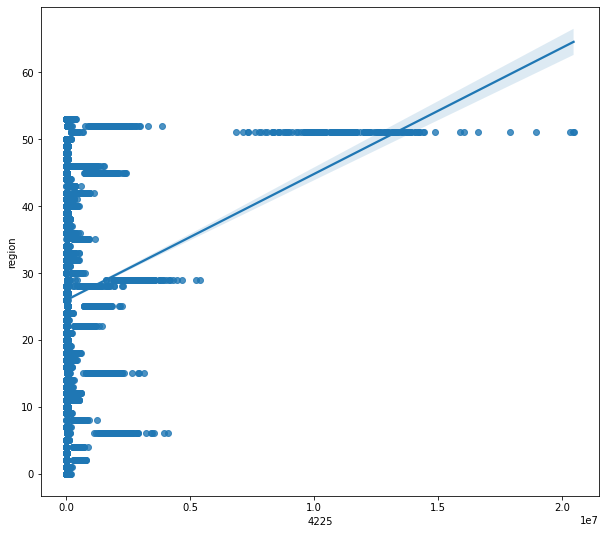

In [62]:
pplot(4)

we are able to see positive linear relationship between the 4225 plu sale and regions.the data is more denser at plu sale is on range of zero to 0.5  unit and as the sale increase we are able to see increase in the datapoints in the regions as well

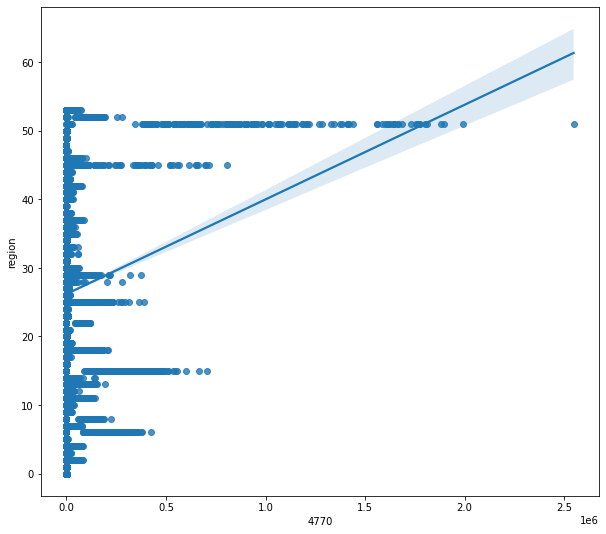

In [63]:
pplot(5)

we are able to see positive linear relationship between the 4770 plu sale and regions.the data is more denser at plu sale is on range of zero to 0.25  unit and as the  sale increase we are able to see increase in the datapoints in the regions as well

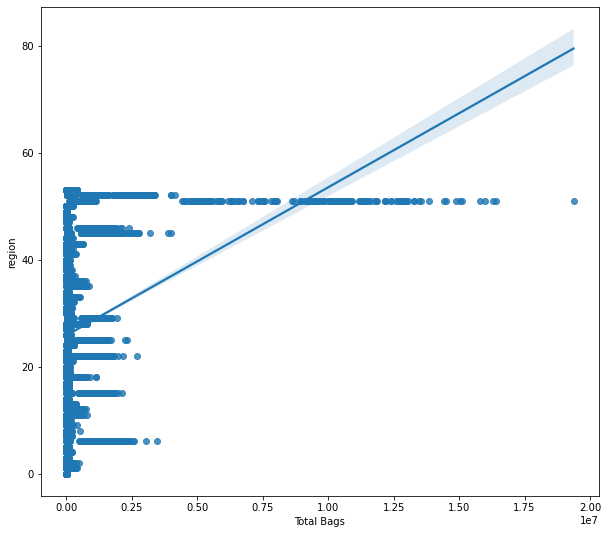

In [64]:
pplot(6)

we are able to see positive linear relationship between the TotalBags   and regions.the data is more denser at TotalBags on range of zero to 0 to .25  unit and as the TotalBags increase we are able to see increase in the datapoints in the regions as well

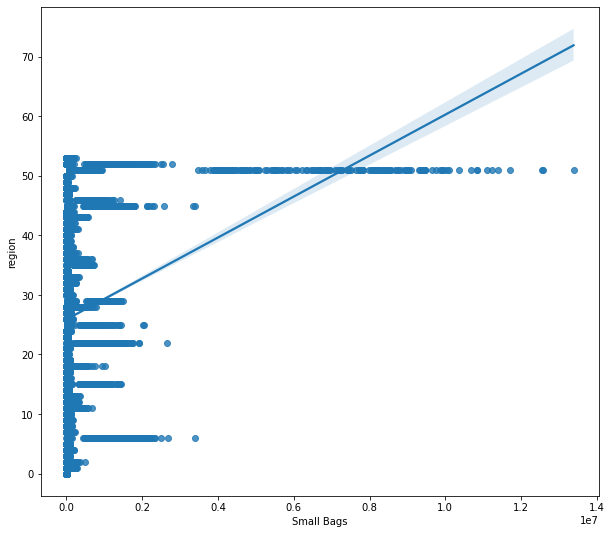

In [65]:
pplot(7)

we are able to see positive linear relationship between the smallBags and regions.the data is more denser at smallBags on range of zero to 0.1  unit and as the smallBags increase we are able to see increase in the datapoints in the regions as well

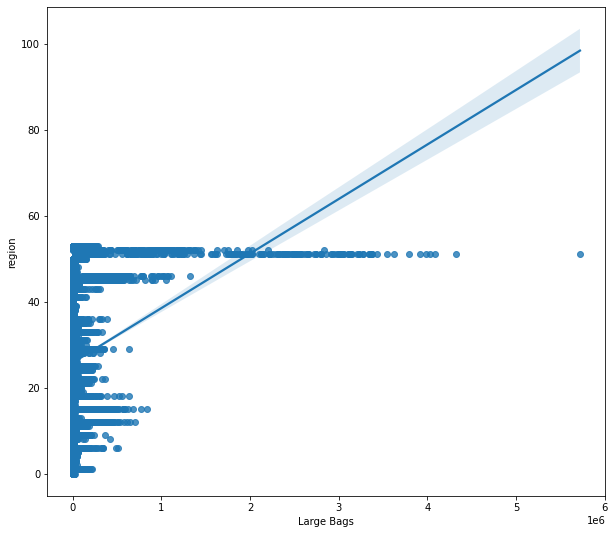

In [66]:
pplot(8)

we are able to see positive linear relationship between the Large Bags and regions.the data is more denser at Large Bags in the range of  zero to 1 unit and as the smallBags increase we are able to see increase in the datapoints in the regions as well

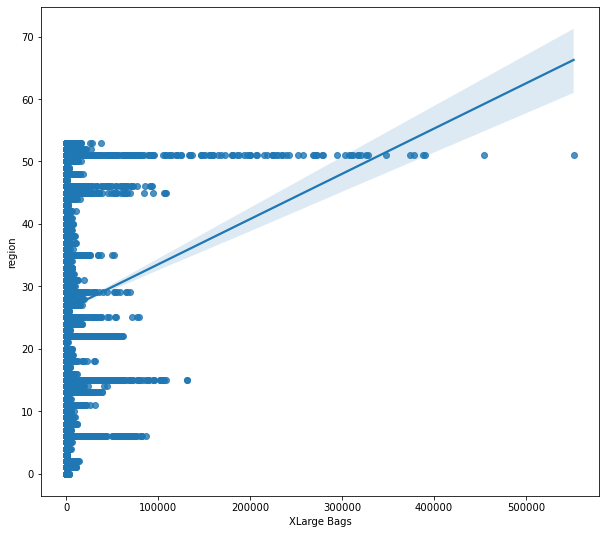

In [67]:
pplot(9)

we are able to see positive linear relationship between the XLarge Bags and regions.the data is more denser at XLarge Bags in the range of zero to 100000 unit and as the XLargeBags increase we are able to see increase in the datapoints in the regions as well

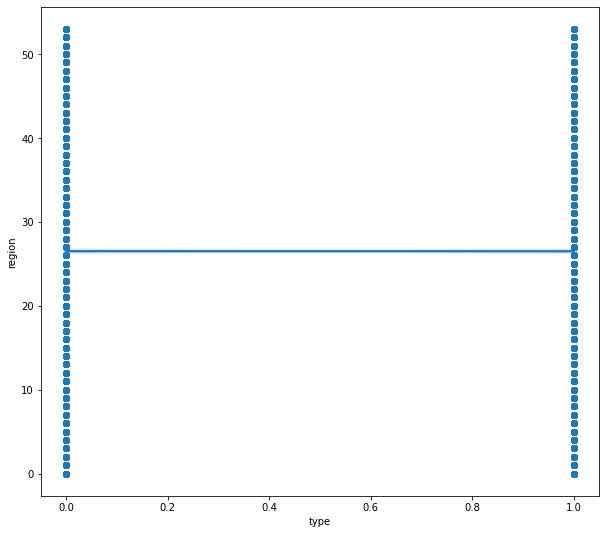

In [68]:
pplot(10)

there is no linear relation between the conventional and organic types of data and data is distributed on therese 2 types

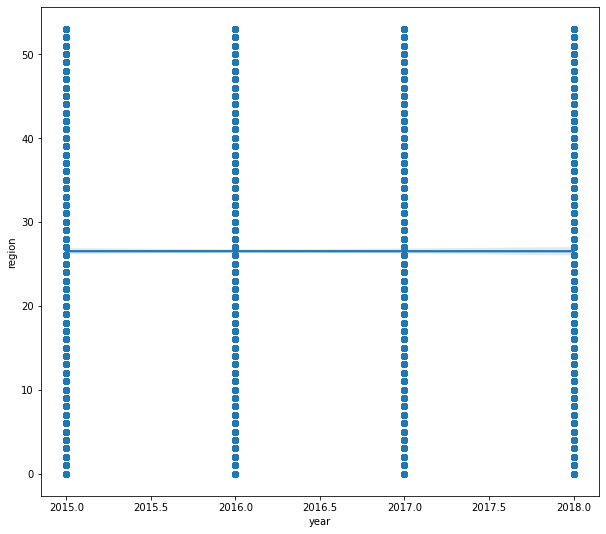

In [69]:
pplot(11)

there is no linear relation between the region and types of year data .

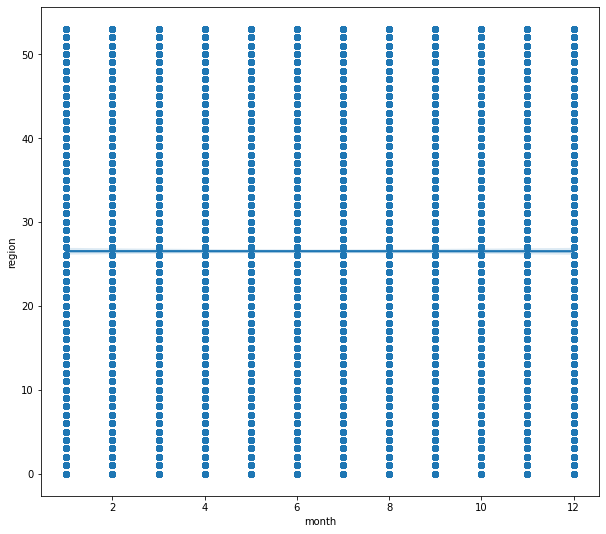

In [71]:
pplot(13)

there is no linear relation between the region and types of month data .

0    9126
1    9123
Name: type, dtype: int64


<AxesSubplot:xlabel='type', ylabel='count'>

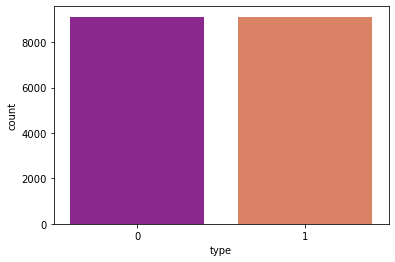

In [72]:
print(df['type'].value_counts())
sns.countplot(x='type',data=df,palette='plasma')

we are able to observe conventional  type has 9126 data and organic tupe has 9123 data.We can see more data in the conventional type here.

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64


<AxesSubplot:xlabel='year', ylabel='count'>

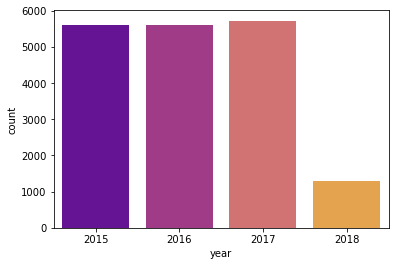

In [73]:
print(df['year'].value_counts())
sns.countplot(x='year',data=df,palette='plasma')

we are able to observe in the year 2015 we have 5615 data available and in 2016 we have 5616 data available and in  2017 we 
have 5722 data available and in 2018 we have only 1296 data available.for each year except the 2018 they are having count more than 5600.

1     1944
3     1836
2     1728
10    1512
7     1512
5     1512
11    1404
8     1404
4     1404
12    1403
9     1296
6     1294
Name: month, dtype: int64


<AxesSubplot:xlabel='month', ylabel='count'>

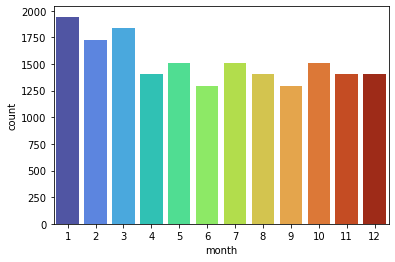

In [74]:
print(df['month'].value_counts())
sns.countplot(x='month',data=df,palette='turbo')

we are able to observe large count of 1944 in 1st month and least 1294 in 6th month .we are able to observe data more than 1290+ in the dataset.We can see gradual reduction and increase in the dataset in each month interval

In [75]:
df.columns

Index(['Unnamed: 0', 'AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year',
       'region', 'month', 'Day'],
      dtype='object')

4     756
11    756
18    755
25    755
1     648
26    648
5     648
12    648
3     648
8     648
15    648
22    648
24    648
17    648
10    648
19    648
7     540
14    540
21    540
28    540
27    540
20    540
29    540
13    540
6     539
2     432
9     432
23    432
30    432
31    432
16    432
Name: Day, dtype: int64


<AxesSubplot:xlabel='Day', ylabel='count'>

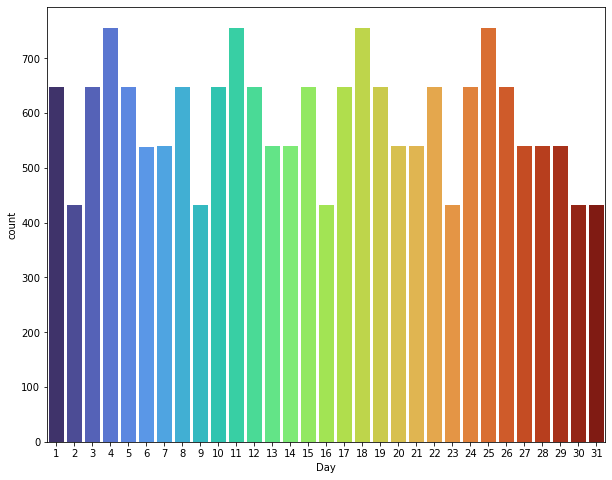

In [76]:
print(df['Day'].value_counts())
plt.figure(figsize=(10,8))
sns.countplot(x='Day',data=df,palette='turbo')

we are able to observe large count in 4th day with 756 and least in 16th day with 432.We are able to see the count is more than 400 in almost all the days in the dataset.

<Figure size 1080x720 with 0 Axes>

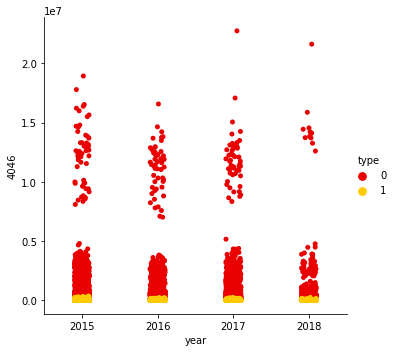

In [77]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4046", hue="type", data=df, palette="hot")
plt.show()

able to observe large no of data in conventional data in years 2015 and 2016 and 2017 and 2018 years  with 4046 sales compared to the organic data type.

<Figure size 1080x720 with 0 Axes>

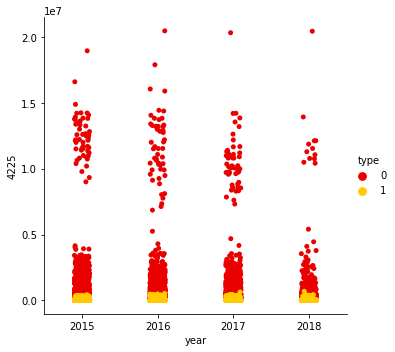

In [78]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4225", hue="type", data=df, palette="hot")
plt.show()

able to observe large no of data in conventional data in years 2015 and 2016 and 2017 and 2018 years  with 4225 sales compared to the organic data type.the most sale are taking place in year 2016

<Figure size 1080x720 with 0 Axes>

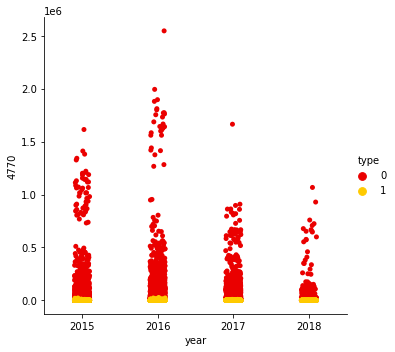

In [79]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4770", hue="type", data=df, palette="hot")
plt.show()

able to observe large no of data in conventional data in years 2015 and 2016 and 2017 and 2018 years  with 4770 sales compared to the organic data type.the most sale are taking place in year 2016

<Figure size 1080x720 with 0 Axes>

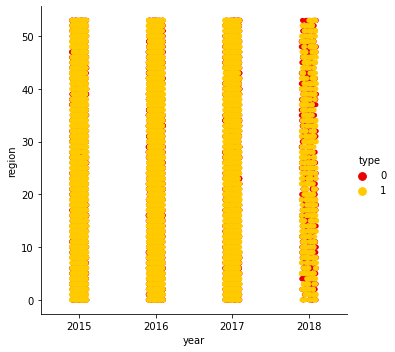

In [80]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="region", hue="type", data=df, palette="hot")
plt.show()

we are able to uniform data along the different years and the data is more denser on the organic when compared to conventional.

<Figure size 1080x720 with 0 Axes>

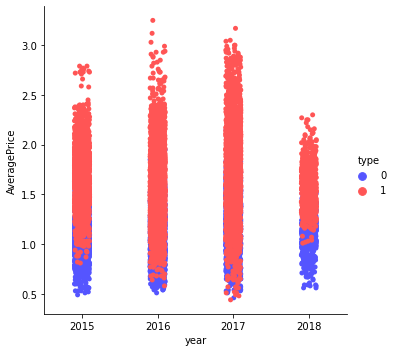

In [81]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="AveragePrice", hue="type", data=df, palette="seismic")
plt.show()

with the help of this catplot we can see that how organic Average price is more than conventional year after year

<Figure size 1080x720 with 0 Axes>

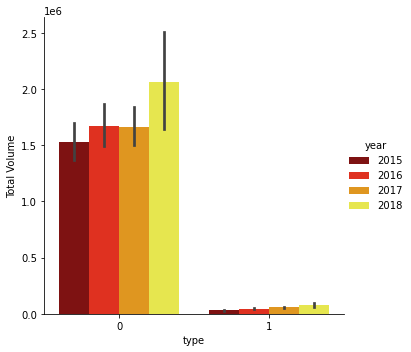

In [82]:
plt.figure(figsize=(15,10))
sns.catplot(x="type", y="Total Volume", hue="year", kind="bar", data=df, palette="hot")
plt.show()

we are able to  see that the the total volume increases along the year .The least total volume is on year 2015 for conventional and max on year 2018.
for organinc The least total volume is on year 2015  and  max on year 2018 in the  dataset

<Figure size 1080x720 with 0 Axes>

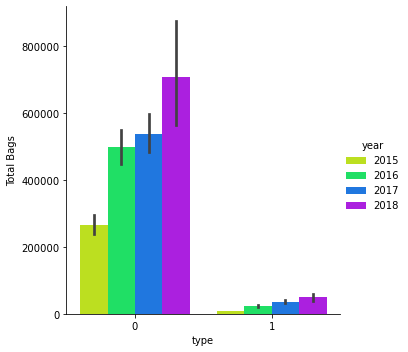

In [83]:
plt.figure(figsize=(15,10))
sns.catplot(x="type", y="Total Bags", hue="year", data=df, kind="bar", palette="hsv")
plt.show()

we are able to observe the Totalbags increase with each year for both conventional and organic.The conentional has more total bags data compared to organic

# Distribution of data on each columns

In [84]:
def dtp(a):
    plt.figure()
    sns.distplot(df[columns[a]],color='green',bins=8)

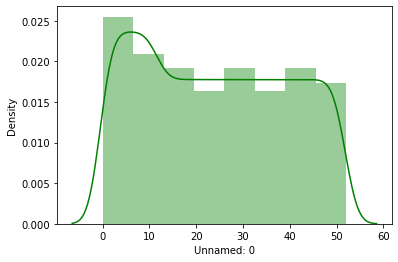

In [85]:
dtp(0)

normal distrinution of the dataset is being observed.


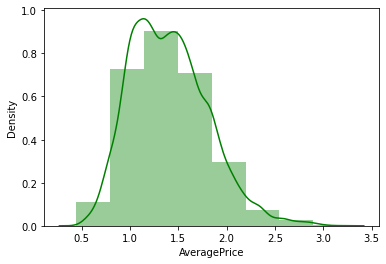

In [86]:
dtp(1)

normal distrinution of the dataset is being observed.


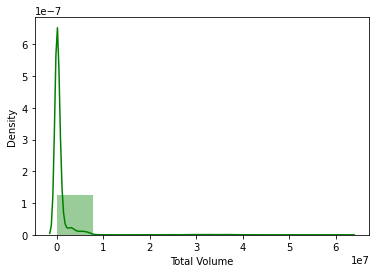

In [87]:
dtp(2)

The data looks right skewed.The building block is out of the normalised curve.


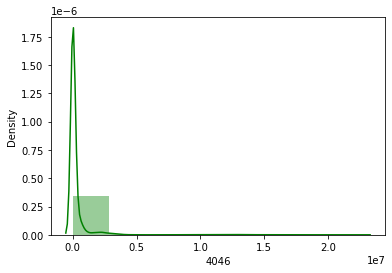

In [88]:
dtp(3)

The data looks right skewed.The building block is out of the normalised curve.


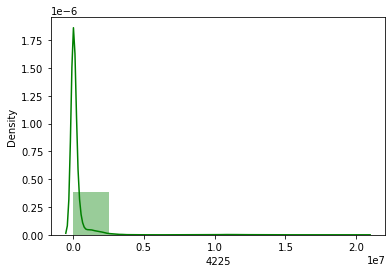

In [89]:
dtp(4)

The data looks right skewed.The building block is out of the normalised curve.


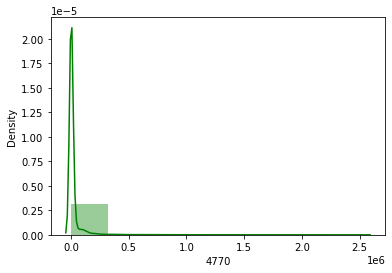

In [90]:
dtp(5)

The data looks right skewed.The building block is out of the normalised curve.


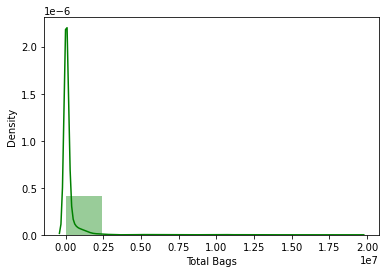

In [91]:
dtp(6)

The data looks right skewed.The building block is out of the normalised curve.


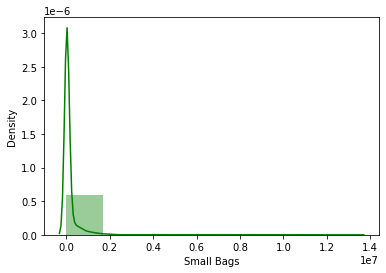

In [92]:
dtp(7)

The data looks right skewed.The building block is out of the normalised curve.


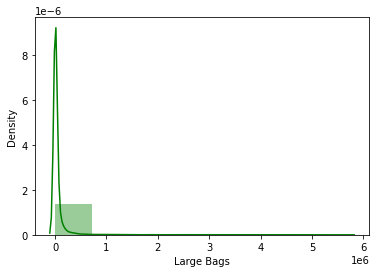

In [93]:
dtp(8)

The data looks right skewed.The building block is out of the normalised curve.


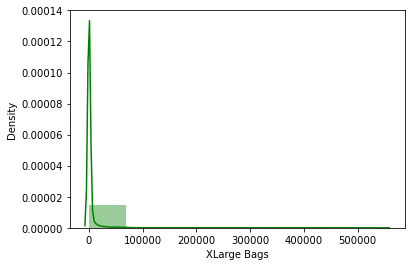

In [94]:
dtp(9)

The data looks right skewed.The building block is out of the normalised curve.


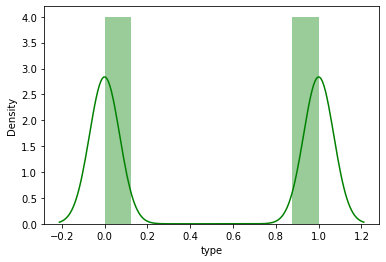

In [95]:
dtp(10)

The data looks  skewed.The building block is out of the normalised curve.and is binomial .


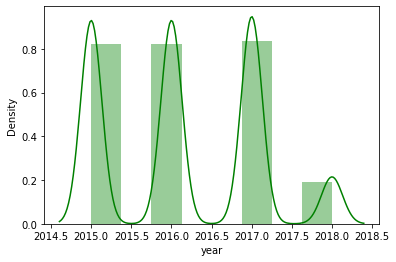

In [96]:
dtp(11)

The data looks  skewed.The building block is out of the normalised curve

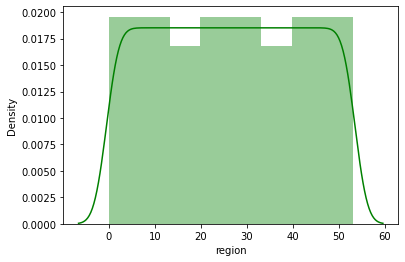

In [97]:
dtp(12)

normal distrinution of the dataset is being observed.

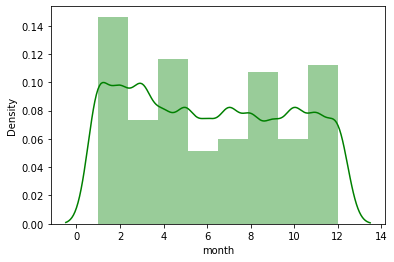

In [98]:
dtp(13)

normal distrinution of the dataset is being observed.


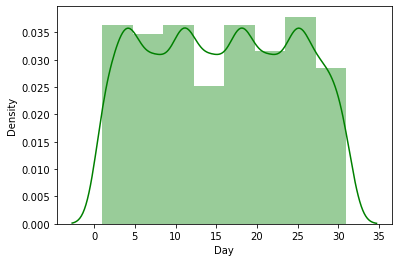

In [99]:
dtp(14)

normal distrinution of the dataset is being observed.


<Figure size 4320x2160 with 0 Axes>

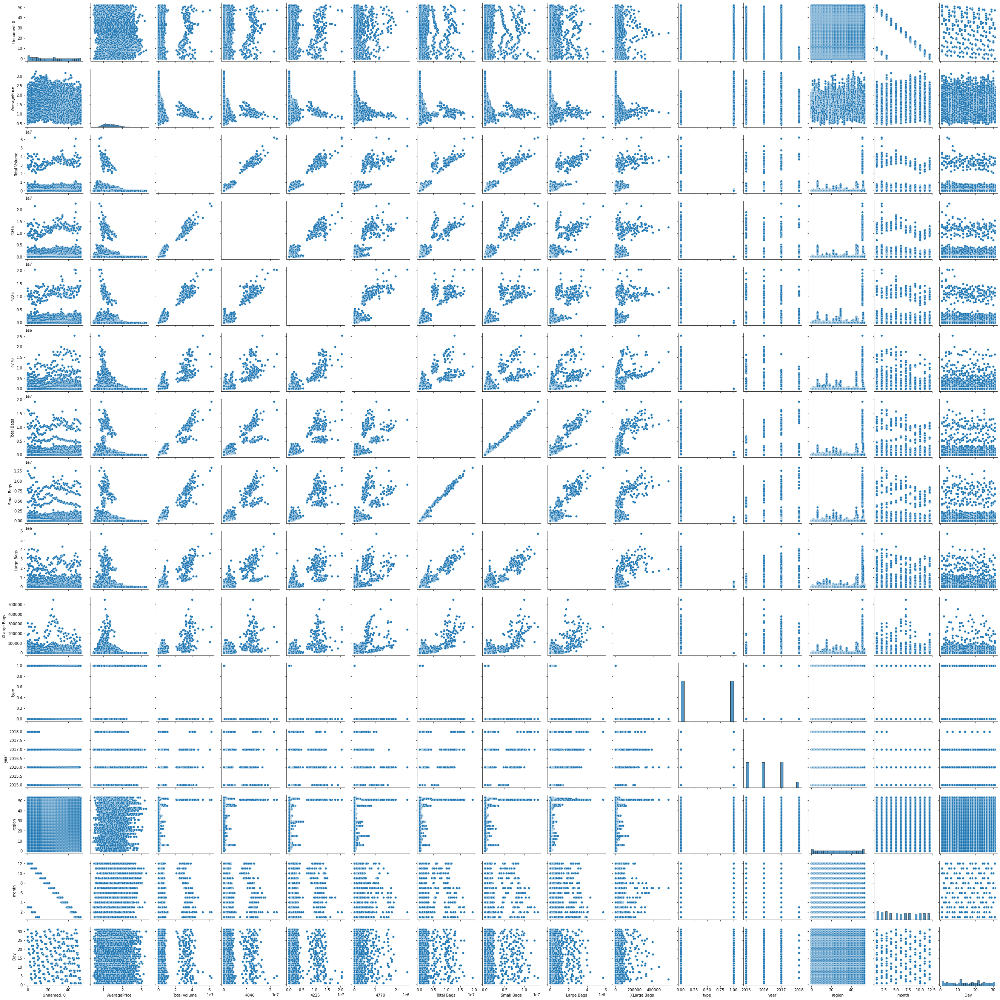

In [100]:
plt.figure(figsize=(60,30))
sns.pairplot(df)

we are able to see positive relation among almost all of the columns in the dataset 

# Detecting Outliers

lets visualise the outliers

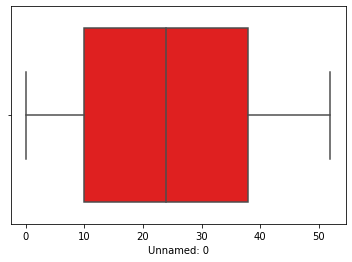

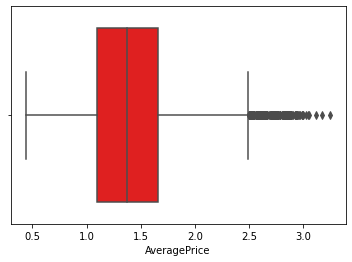

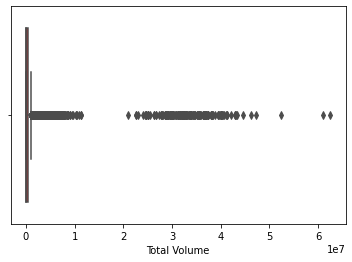

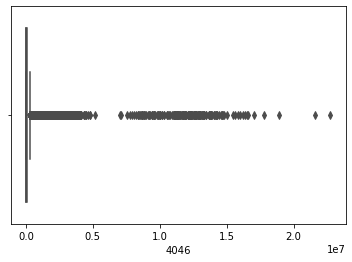

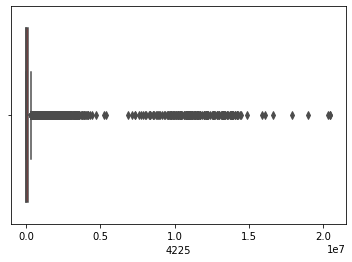

...

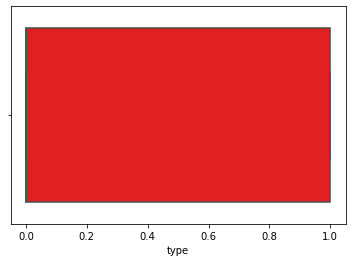

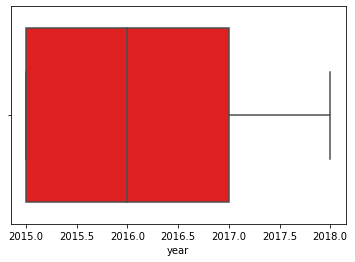

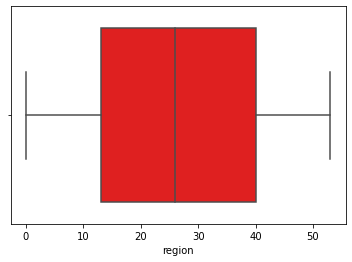

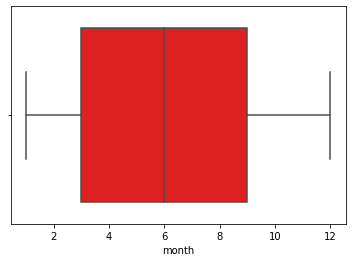

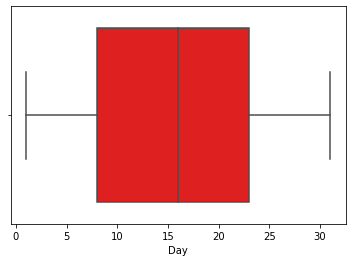

In [101]:
def bxplt(a):
    plt.figure()
    sns.boxplot(df[columns[a]],data=df,color='red')
    
for i in range(0,15):
    bxplt(i)

we are able to observe the outliers in Average price and total volume and 4046 and 4225  and 4770 and total bags and small bags and large bags and xlarge bags and 

In [102]:
ncol=14
nrows=10

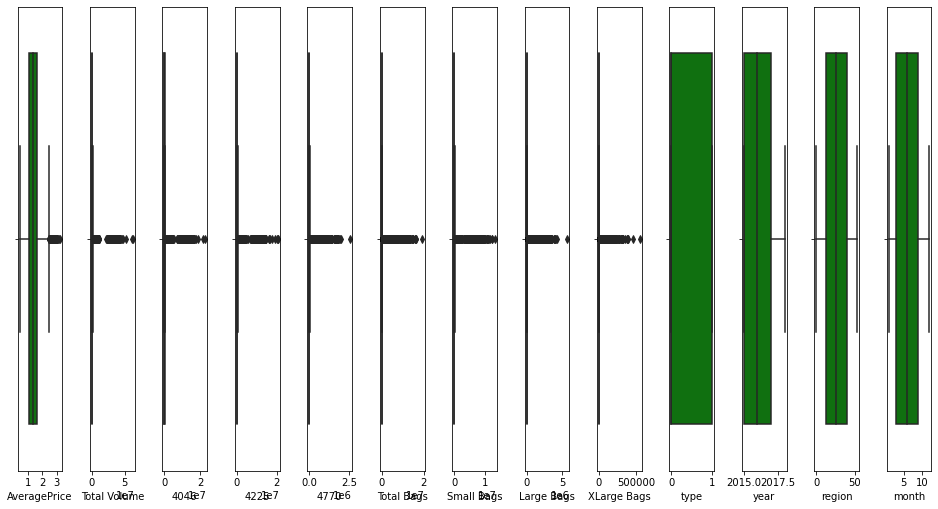

In [103]:
# to see outliers in a single visualization

plt.figure(figsize=(ncol,5*ncol))
for i in range(1,(len(columns)-1)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[columns[i]],color='green',orient='v')
    plt.tight_layout()

# Removing outliers

In [13]:
z=np.abs(zscore(df))
z

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,Day
0,1.565327,0.188689,0.227716,0.230816,0.199902,0.212091,0.234170,0.232647,0.222352,0.17558,0.999836,1.221282,1.700252,1.647632,1.291857
1,1.500730,0.139020,0.230427,0.231103,0.208054,0.211997,0.233350,0.231568,0.222335,0.17558,0.999836,1.221282,1.700252,1.647632,0.494231
2,1.436133,1.182069,0.212085,0.231007,0.154478,0.211325,0.234730,0.233399,0.222311,0.17558,0.999836,1.221282,1.700252,1.647632,0.303396
3,1.371536,0.809551,0.223444,0.230741,0.185350,0.211864,0.237096,0.236568,0.222186,0.17558,0.999836,1.221282,1.700252,1.647632,1.101022
4,1.306939,0.312861,0.231538,0.230891,0.208719,0.211834,0.236718,0.236154,0.221924,0.17558,0.999836,1.221282,1.700252,1.364669,1.519750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.113149,0.556347,0.241373,0.230017,0.243857,0.212540,0.229301,0.226665,0.220964,0.17558,1.000164,1.970504,1.700811,1.181997,1.328915
18245,1.048552,0.755023,0.242296,0.230693,0.242277,0.212540,0.233594,0.232196,0.221403,0.17558,1.000164,1.970504,1.700811,1.464959,1.405803
18246,0.983955,1.152375,0.242331,0.230693,0.243090,0.205766,0.233463,0.231644,0.222561,0.17558,1.000164,1.970504,1.700811,1.464959,0.608177
18247,0.919358,1.301382,0.241625,0.230428,0.242651,0.205774,0.231866,0.229543,0.222529,0.17558,1.000164,1.970504,1.700811,1.464959,0.189449


In [14]:
threshold=3
print(np.where(z>3))

(array([  346,   359,   780, ..., 17304, 17402, 17428], dtype=int64), array([3, 3, 9, ..., 1, 1, 1], dtype=int64))


In [15]:
df_new1=df[(z<3).all(axis=1)]

In [16]:
df_new1.shape[0]

17651

In [108]:
#chcking data loss
data_loss=((df.shape[0]-df_new1.shape[0])/df.shape[0])*100
print(data_loss)

3.276891884486821


since data loss is less than 5% it is allowable and we can go with the dataset

In [17]:
#saving the upadated dataset 
df=df_new1

# Skewness Removal

In [18]:
#initialising x and y
X=df.drop(['region'],axis=1)
y=df.region

In [19]:
df.shape

(17651, 15)

In [20]:
X.skew().sort_values(ascending=False)

XLarge Bags     6.135607
4770            5.117170
Large Bags      5.053434
4046            4.909848
4225            4.455745
Small Bags      4.222706
Total Bags      4.066771
Total Volume    3.767138
AveragePrice    0.377432
year            0.229976
month           0.107408
Unnamed: 0      0.106116
Day             0.011778
type           -0.037741
dtype: float64

we are able to see skewness in the columns XLarge Bags,4770,Large Bags,4046,4225,Small Bags,Total Bags,Total Volume  

In [21]:
X['XLarge Bags']=PowerTransformer().fit_transform(X['XLarge Bags'].values.reshape(-1,1))
X['Large Bags']=PowerTransformer().fit_transform(X['Large Bags'].values.reshape(-1,1))
X['4046']=PowerTransformer().fit_transform(X['4046'].values.reshape(-1,1))
X['4225']=PowerTransformer().fit_transform(X['4225'].values.reshape(-1,1))
X['Small Bags']=PowerTransformer().fit_transform(X['Small Bags'].values.reshape(-1,1))
X['Total Bags']=PowerTransformer().fit_transform(X['Total Bags'].values.reshape(-1,1))
X['Total Volume']=PowerTransformer().fit_transform(X['Total Volume'].values.reshape(-1,1))
X['4770']=PowerTransformer().fit_transform(X['4770'].values.reshape(-1,1))


In [22]:
X.skew().sort_values(ascending=False)

XLarge Bags     0.853758
AveragePrice    0.377432
year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
dtype: float64

Skewness is treated. It is in range -0.5 to 0.5 except XLarge Bags column . 

In [23]:
X['XLarge Bags']=np.sqrt(X['XLarge Bags'].values.reshape(-1,1))

In [24]:
X.skew().sort_values(ascending=False)

AveragePrice    0.377432
year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
XLarge Bags    -2.492399
dtype: float64

In [25]:
X['XLarge Bags']=np.cbrt(X['XLarge Bags'].values.reshape(-1,1))

In [26]:
X.skew().sort_values(ascending=False)

AveragePrice    0.377432
year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
XLarge Bags    -3.532746
dtype: float64

<AxesSubplot:xlabel='XLarge Bags', ylabel='Density'>

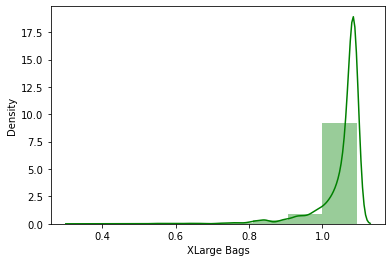

In [27]:
sns.distplot(X['XLarge Bags'],color='green',bins=8)

We are unable to reduce the skewness for 'XLarge Bags' so we have to drop that column

In [28]:
X.drop('XLarge Bags',axis=1,inplace=True)

In [29]:
X.skew().sort_values(ascending=False)

AveragePrice    0.377432
year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
dtype: float64

# Feature selection

In [30]:
from sklearn.feature_selection import SelectKBest,f_classif

In [31]:
best_features = SelectKBest(score_func=f_classif ,k=11)

fit_1 = best_features.fit(X,y)
df_scores = pd.DataFrame(fit_1.scores_)
df_columns =pd.DataFrame(X.columns)
#concatenate dataframes

features_scores =pd.concat([df_columns,df_scores],axis=1 )
features_scores

,0,0
0,Unnamed: 0,0.037343
1,AveragePrice,66.703681
2,Total Volume,117.862821
3,4046,180.496551
4,4225,142.465197
5,4770,83.735973
6,Total Bags,129.107307
7,Small Bags,127.162536
8,Large Bags,156.862958
9,type,4.399338


In [32]:
features_scores.columns = ['Feature_Name','Score']  #Name o/p col
print(features_scores.nlargest(11,'Score'))

    Feature_Name       Score
3           4046  180.496551
8     Large Bags  156.862958
4           4225  142.465197
6     Total Bags  129.107307
7     Small Bags  127.162536
2   Total Volume  117.862821
5           4770   83.735973
1   AveragePrice   66.703681
9           type    4.399338
10          year    0.382588
11         month    0.137242


we can drop the columns day and unnamed from the dataset as their scores are less than 0.1

# scaling the dataset 

In [125]:
scaler=StandardScaler()

<AxesSubplot:>

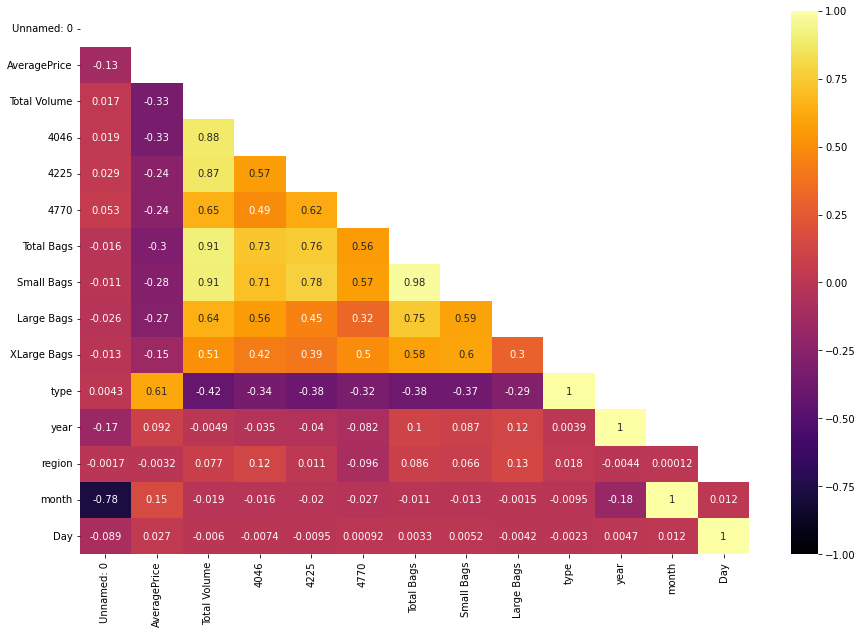

In [126]:
D=df.corr().drop(['XLarge Bags','region'],axis=1)
upper_triangle = np.triu(D)
plt.figure(figsize=(15,10))
sns.heatmap(D , vmin=-1, vmax=1, annot=True,cmap="inferno", mask=upper_triangle)

In [127]:
X=X[['AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'Small Bags', 'Large Bags', 'type','year','month']]

In [128]:
X.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'type', 'year', 'month'],
      dtype='object')

In [129]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,2.282441,AveragePrice
1,54.562520,Total Volume
2,6.857826,4046
3,12.399435,4225
4,3.902271,4770
5,36.039698,Total Bags
6,17.284986,Small Bags
7,3.474910,Large Bags
8,3.840685,type
9,1.481920,year


we are able to see Total Volume,Total Bags,Small Bags,4225 having vif greater than 10 so we need to drop it iteratively.see thye values

In [130]:
X.drop('Total Volume',axis=1,inplace=True)

In [131]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,2.223832,AveragePrice
1,3.583100,4046
2,4.676218,4225
3,3.888302,4770
4,26.867956,Total Bags
5,17.275844,Small Bags
6,3.419452,Large Bags
7,3.740379,type
8,1.481843,year
9,1.136493,month


In [132]:
X.drop('Total Bags',axis=1,inplace=True)

In [133]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,2.033734,AveragePrice
1,3.575978,4046
2,4.370032,4225
3,3.887830,4770
4,4.184640,Small Bags
5,2.074920,Large Bags
6,3.707052,type
7,1.412676,year
8,1.123536,month


No multicollinearity now. Removed all the multicollinear columns. Now we can fit the datas to model and check score

In [134]:
X.columns

Index(['AveragePrice', '4046', '4225', '4770', 'Small Bags', 'Large Bags',
       'type', 'year', 'month'],
      dtype='object')

# Model Building

In [135]:
#X,y already initialized
X.shape

(17651, 9)

In [136]:
y.shape

(17651,)

In [137]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score


In [138]:
#finding best random_state

maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=i)
    rf=RandomForestClassifier(n_estimators=100)
    rf.fit(x_train,y_train)
    
    predrf=rf.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)

Best accuracy is  0.9255168507504956  on random_state  97


In [139]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=97)

In [140]:
#shapes of x and y (train,test)
x_train.shape

(14120, 9)

In [141]:
#shape of test features
x_test.shape

(3531, 9)

In [142]:
#shape of train features
y_train.shape

(14120,)

In [143]:
#shape of test label
y_test.shape

(3531,)

In [144]:
# different algorithm going to use
knn=KNeighborsClassifier()
sv=SVC()
dtc=DecisionTreeClassifier()
rf=RandomForestClassifier(n_estimators=100)
gd=GradientBoostingClassifier()
xgb=XGBClassifier()

In [145]:
#code for Training and Prediction 

def evaluate(x):
    model=x
    print(model)
    #training the model
    model.fit(x_train,y_train)
    pred_train=model.predict(x_train)
    #model prediction
    pred=model.predict(x_test)
    print("train accuracy score is {:.2f}%".format(accuracy_score(y_train,pred_train)*100))
    print("test accuracy score is {:.2f}%".format(accuracy_score(y_test,pred)*100))
    
    print("Confusion Matrix : \n",confusion_matrix(y_test,pred))
    print("\n")
    print("Classification Report  : \n",classification_report(y_test,pred))

In [146]:
#calling KNeighborsClassifier model
evaluate(knn)

KNeighborsClassifier()
train accuracy score is 90.69%
test accuracy score is 84.37%
Confusion Matrix : 
 [[68  0  0 ...  0  0  0]
 [ 0 62  0 ...  0  0  1]
 [ 0  0 74 ...  0  0  0]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 60  0]
 [ 0  0  0 ...  0  0 54]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.78      0.96      0.86        71
           1       0.72      0.82      0.77        76
           2       0.90      0.99      0.94        75
           3       0.86      0.84      0.85        70
           4       0.96      0.90      0.93        61
           5       0.86      0.79      0.82        76
           6       0.94      1.00      0.97        51
           7       0.84      0.91      0.87        74
           8       0.93      0.93      0.93        55
           9       0.67      0.82      0.74        55
          10       0.69      0.76      0.73        68
          11       0.82      0.96      0.89        81
       

In [147]:
#calling DecisionTreeClassifier model
evaluate(dtc)

DecisionTreeClassifier()
train accuracy score is 100.00%
test accuracy score is 80.71%
Confusion Matrix : 
 [[54  0  0 ...  0  0  0]
 [ 0 55  0 ...  0  0  4]
 [ 0  0 69 ...  0  0  1]
 ...
 [ 0  0  0 ... 40  0  0]
 [ 0  0  0 ...  0 56  0]
 [ 0  0  0 ...  0  0 45]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.84      0.76      0.80        71
           1       0.82      0.72      0.77        76
           2       0.92      0.92      0.92        75
           3       0.81      0.77      0.79        70
           4       0.90      0.85      0.87        61
           5       0.74      0.78      0.76        76
           6       0.85      0.88      0.87        51
           7       0.85      0.89      0.87        74
           8       0.94      0.91      0.93        55
           9       0.78      0.76      0.77        55
          10       0.78      0.66      0.71        68
          11       0.81      0.81      0.81        81
    

In [148]:
#calling SVC model
evaluate(sv)

SVC()
train accuracy score is 84.51%
test accuracy score is 81.65%
Confusion Matrix : 
 [[66  0  0 ...  0  0  0]
 [ 0 53  0 ...  0  0  2]
 [ 0  0 74 ...  0  0  0]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 63  0]
 [ 0  1  1 ...  0  0 51]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.68      0.93      0.79        71
           1       0.59      0.70      0.64        76
           2       0.96      0.99      0.97        75
           3       0.96      0.73      0.83        70
           4       0.95      0.97      0.96        61
           5       0.89      0.71      0.79        76
           6       0.98      0.96      0.97        51
           7       0.91      0.81      0.86        74
           8       1.00      1.00      1.00        55
           9       0.75      0.80      0.77        55
          10       0.57      0.63      0.60        68
          11       0.87      0.80      0.83        81
          12       0.89 

In [149]:
#calling RandomForestClassifier model
evaluate(rf)

RandomForestClassifier()
train accuracy score is 100.00%
test accuracy score is 92.52%
Confusion Matrix : 
 [[67  0  0 ...  0  0  0]
 [ 0 69  0 ...  0  0  1]
 [ 0  0 75 ...  0  0  0]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 65  0]
 [ 0  0  0 ...  0  0 57]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.88      0.94      0.91        71
           1       0.90      0.91      0.90        76
           2       0.99      1.00      0.99        75
           3       0.94      0.83      0.88        70
           4       1.00      0.97      0.98        61
           5       0.94      0.89      0.92        76
           6       0.94      1.00      0.97        51
           7       0.96      0.95      0.95        74
           8       1.00      1.00      1.00        55
           9       0.95      0.95      0.95        55
          10       0.88      0.88      0.88        68
          11       0.92      0.94      0.93        81
    

In [150]:
from xgboost import XGBClassifier

In [151]:
#calling GradientBoostingClassifier
evaluate(gd)

GradientBoostingClassifier()
train accuracy score is 97.83%
test accuracy score is 83.72%
Confusion Matrix : 
 [[67  0  0 ...  0  0  0]
 [ 0 57  0 ...  0  0  2]
 [ 0  0 72 ...  0  0  0]
 ...
 [ 0  0  0 ... 38  1  0]
 [ 0  0  0 ...  0 59  0]
 [ 0  0  1 ...  0  0 54]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.85      0.94      0.89        71
           1       0.78      0.75      0.77        76
           2       0.91      0.96      0.94        75
           3       0.80      0.73      0.76        70
           4       0.89      0.89      0.89        61
           5       0.86      0.87      0.86        76
           6       0.91      0.96      0.93        51
           7       0.88      0.91      0.89        74
           8       0.98      0.98      0.98        55
           9       0.86      0.87      0.86        55
          10       0.72      0.71      0.71        68
          11       0.81      0.80      0.81        81
 

In [152]:
#calling RandomForestClassifier model
evaluate(xgb)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...)
train accuracy score is 100.00%
test accuracy score is 89.46%
Confusion Matrix : 
 [[66  0  0 ...  0  0  0]
 [ 0 67  0 ...  0  0  3]
 [ 0  0 71 ...  0  0  1]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 64  0]
 [ 0  0  1 ...  0  0 50]]


Classification Rep

In [153]:
model=[knn,sv,rf,dtc,gd,xgb]

for m in model:
    score=cross_val_score(m,X,y,cv=5)
    print(m,"Cross val score is ",score*100,"   ")
    print("mean is ",score.mean()*100,"\n\n")

KNeighborsClassifier() Cross val score is  [53.61087511 55.63739377 50.16997167 45.9490085  35.32577904]    
mean is  48.13860561614129 


SVC() Cross val score is  [64.5143019  75.4674221  65.09915014 60.50991501 42.63456091]    
mean is  61.645070011223936 


RandomForestClassifier() Cross val score is  [65.98697253 81.69971671 77.76203966 69.66005666 50.67988669]    
mean is  69.1577344491485 


DecisionTreeClassifier() Cross val score is  [50.66553384 67.8470255  62.29461756 51.72804533 41.24645892]    
mean is  54.75633623037716 


GradientBoostingClassifier() Cross val score is  [47.72019258 76.45892351 70.11331445 63.54107649 40.11331445]    
mean is  59.58936429503796 


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_typ

we can see the model is underfitting.The least difference between the accuracy and crossvalidation is SVC model.lets do hypertuning on this model.

# Hyper parameter tuning

we will try to improve accuracy by hypertuning

In [167]:
grid_params ={'C' :np.arange(1,50,5),
             'gamma': ['scale','auto'],
             'kernel':['lnear','poly','rbf','sigmoid'],
             'class_weight':['balanced',None],
             'decision_function_shape':['ovo','ovr'],
             'random_state':[int, None]}

In [168]:
from sklearn.model_selection import GridSearchCV

grid_search= GridSearchCV(estimator=sv,param_grid=grid_params,cv= 5,n_jobs=-1)

In [169]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': array([ 1,  6, 11, 16, 21, 26, 31, 36, 41, 46]),
                         'class_weight': ['balanced', None],
                         'decision_function_shape': ['ovo', 'ovr'],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['lnear', 'poly', 'rbf', 'sigmoid'],
                         'random_state': [<class 'int'>, None]})

In [170]:
grid_search.best_params_

{'C': 41,
 'class_weight': 'balanced',
 'decision_function_shape': 'ovo',
 'gamma': 'scale',
 'kernel': 'rbf',
 'random_state': None}

In [171]:
hsvc = SVC(C=41,class_weight= 'balanced',decision_function_shape='ovo',gamma= 'scale',kernel= 'rbf',
                            random_state=None)

In [172]:
evaluate(hsvc)

SVC(C=41, class_weight='balanced', decision_function_shape='ovo')
train accuracy score is 96.89%
test accuracy score is 93.85%
Confusion Matrix : 
 [[70  0  0 ...  0  0  0]
 [ 0 69  0 ...  0  0  1]
 [ 0  0 75 ...  0  0  0]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 65  0]
 [ 0  0  0 ...  0  0 59]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.88      0.99      0.93        71
           1       0.88      0.91      0.90        76
           2       1.00      1.00      1.00        75
           3       0.97      0.87      0.92        70
           4       0.98      0.98      0.98        61
           5       0.94      0.88      0.91        76
           6       0.98      1.00      0.99        51
           7       0.95      0.99      0.97        74
           8       1.00      1.00      1.00        55
           9       0.89      0.93      0.91        55
          10       0.89      0.87      0.88        68
          11      

In [ ]:
we are able to increase the accuracy from 81.65 to 93.85.So we will go with hypertuned svc() model.

In [187]:
#saving the model
joblib.dump(hsvc,"avacodo_Dataset.obj")

['avacodo_Dataset.obj']

In [188]:
#Lets Check loading the file 

avacodo_reg_prediction=joblib.load("avacodo_Dataset.obj")

In [190]:
pred=hsvc.predict(x_test)
Conclusion=pd.DataFrame([avacodo_reg_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Model Created Succesfully for classifcation now lets do it for regression approach

# finding the average price

In [193]:
#importing dataset
data=pd.read_csv('Avocado.csv')
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [194]:
data["month"] = pd.to_datetime(data.Date, format="%Y/%m/%d").dt.month
data["Day"] = pd.to_datetime(data.Date, format="%Y/%m/%d").dt.day

In [195]:
#dropping 'unnamed' and 'Date' data from the dataset
data.drop(columns=["Date"],axis=1,inplace=True)

In [196]:
#updated Dataset shape
data.shape

(18249, 15)

In [197]:
#lets check for duplicates in the dataset 
data.drop_duplicates(inplace=True)
data.shape

(18249, 15)

In [198]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 18248
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
 13  month         18249 non-null  int64  
 14  Day           18249 non-null  int64  
dtypes: float64(9), int64(4), object(2)
memory usage: 2.2+ MB


In [199]:
#checking the availabel null values in the dataset 
data.isnull().sum()

Unnamed: 0      0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
month           0
Day             0
dtype: int64

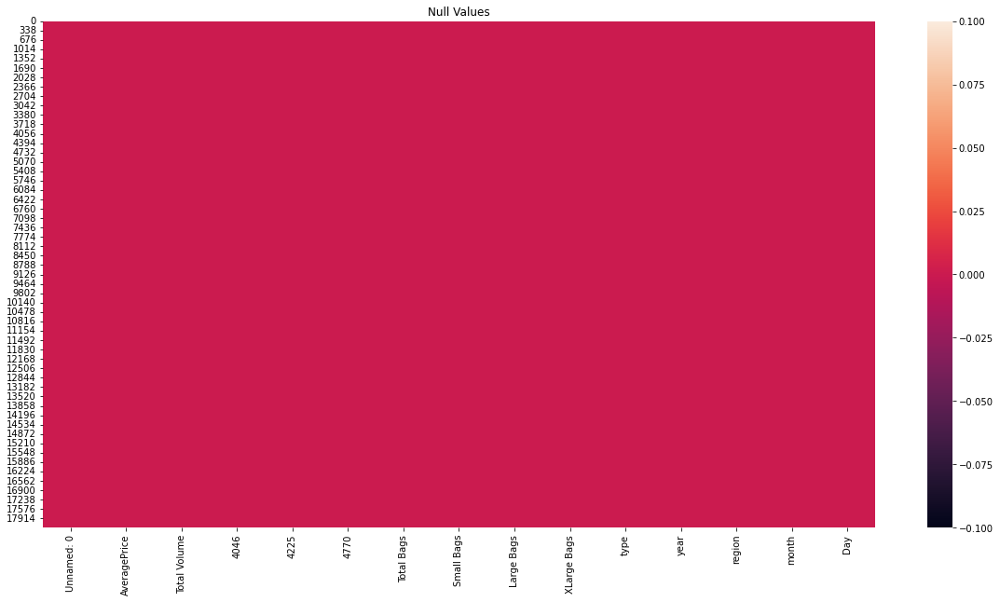

In [200]:
#heatmap on null values
plt.figure(figsize=[20,10])
sns.heatmap(data.isnull())
plt.title("Null Values")
plt.show()

In [ ]:
there are no whitespaces or null values present in the dataset so we can continue with the dataset as we have non null values equal to same no of available rows in the dataset

In [201]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,18249.0,24.232232,1.548104e+01,0.00,10.00,24.00,38.00,52.00
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65


there are no whitespaces or null values present in the dataset so we can continue with the dataset as we have non null values equal to same no of available rows in the dataset

In [202]:
data['region'].nunique()

54

we have already plotted the univariant analysis in above so moving to bivariant analysis.the label will be 

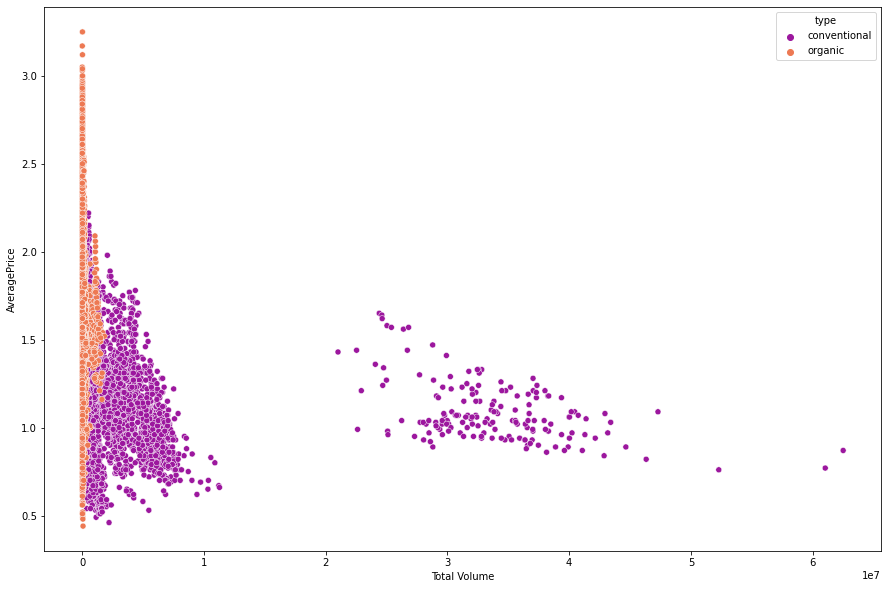

In [204]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Total Volume', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the total volume and Avg price.the data is more denser at totla volume is on range of zero to 1 unit and as the total volume increase we are able to see increase in the datapoints in the Avg price as well

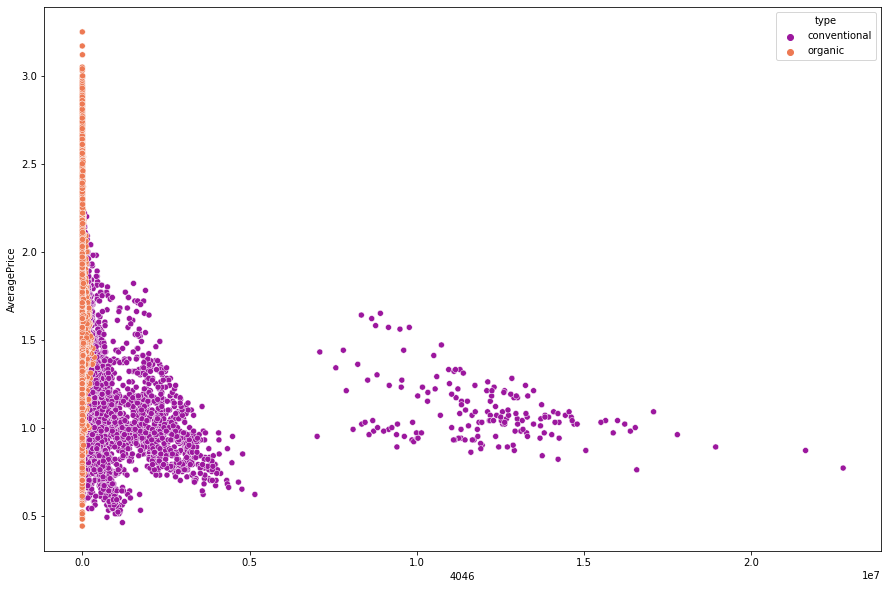

In [205]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4046', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the 4046 and Avg price.the data is more denser at totla volume is on range of zero to 0.5 unit and as the 4046 increase we are able to see increase in the datapoints in the Avg price as well

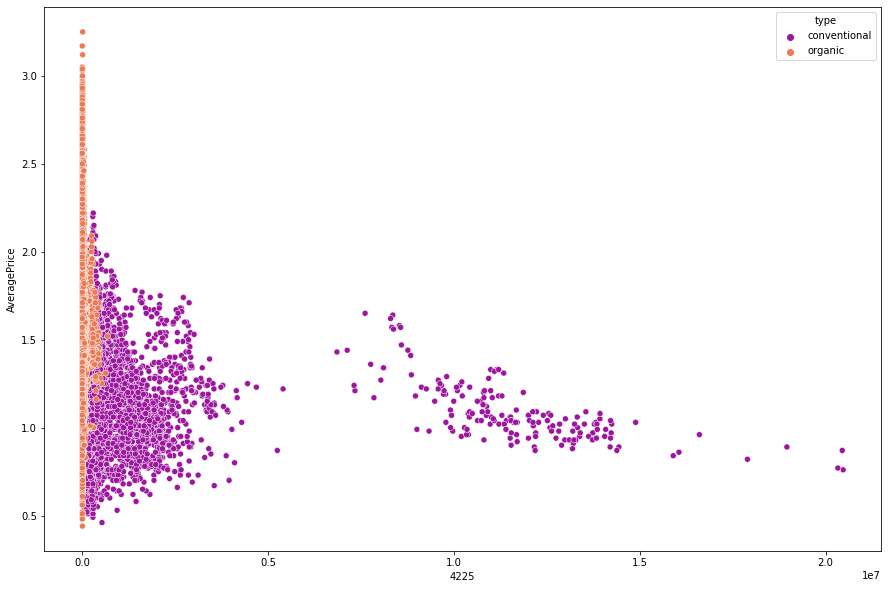

In [206]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4225', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the 4225 and Avg price.the data is more denser at totla volume is on range of zero to 0.5 unit and as the 4225 increase we are able to see increase in the datapoints in the Avg price as well

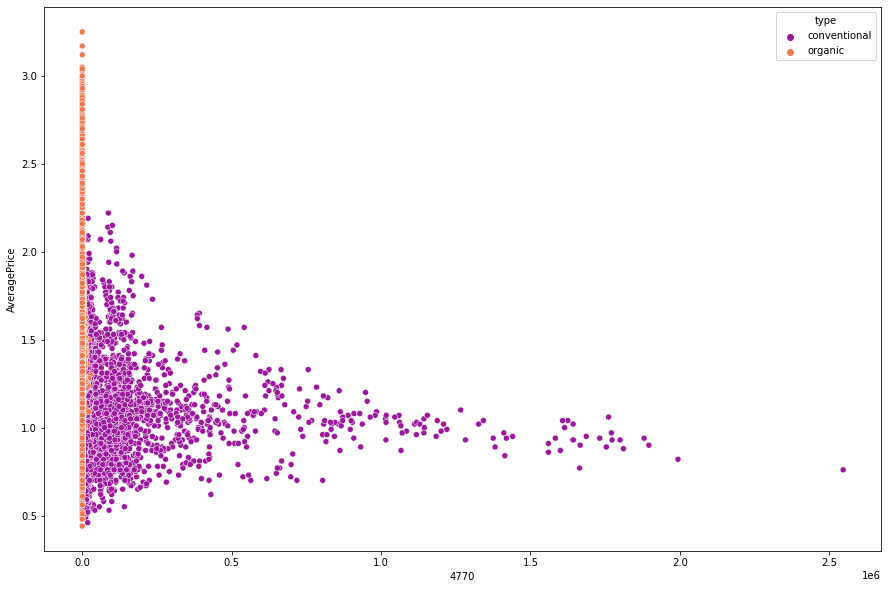

In [207]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='4770', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the 4770 and Avg price.the data is more denser at totla volume is on range of zero to 0.5 unit and as the 4770 increase we are able to see increase in the datapoints in the Avg price as well

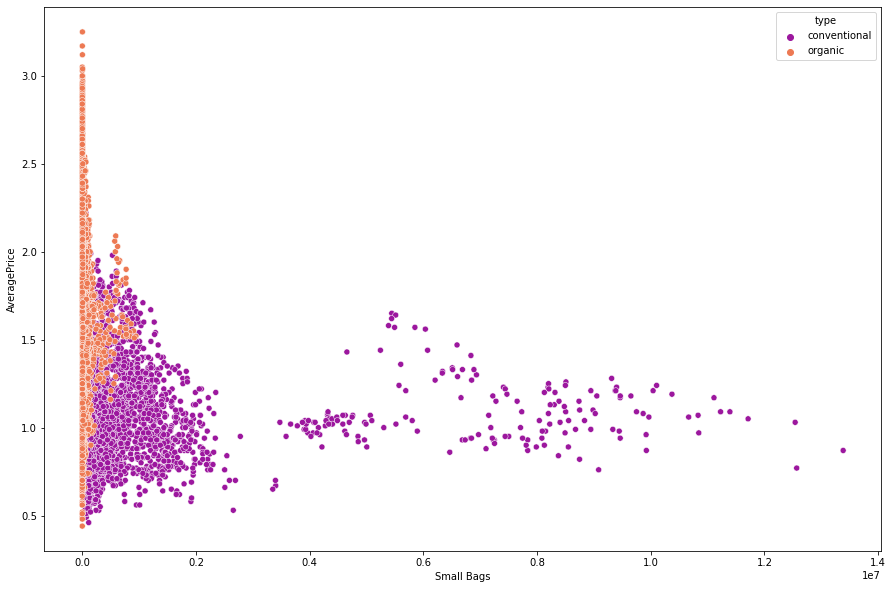

In [208]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Small Bags', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the smallbags and Avg price.the data is more denser at totla volume is on range of zero to 0.2 unit and as the smallbags increase we are able to see increase in the datapoints in the Avg price as well

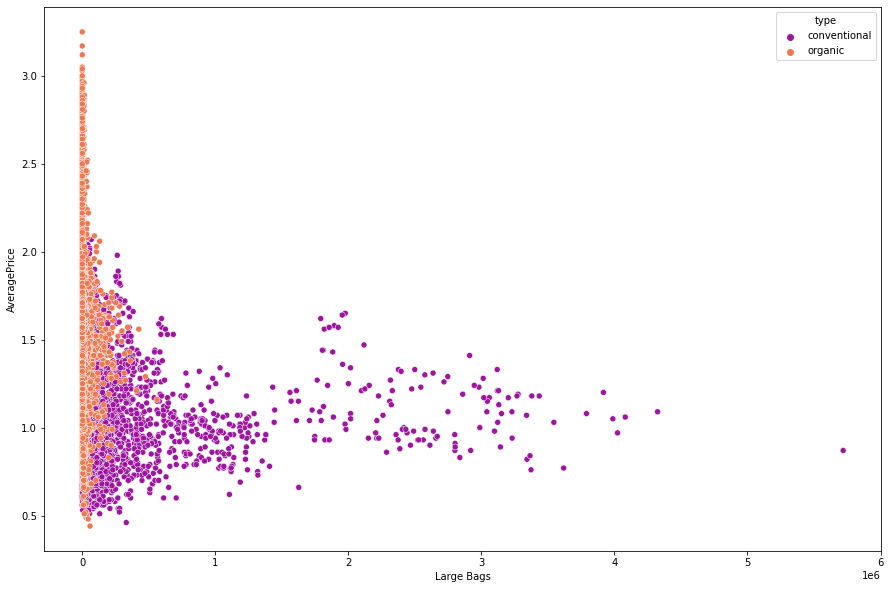

In [209]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Large Bags', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the largebags and Avg price.the data is more denser at totla volume is on range of zero to 1 unit and as the large bags increase we are able to see increase in the datapoints in the Avg price as well

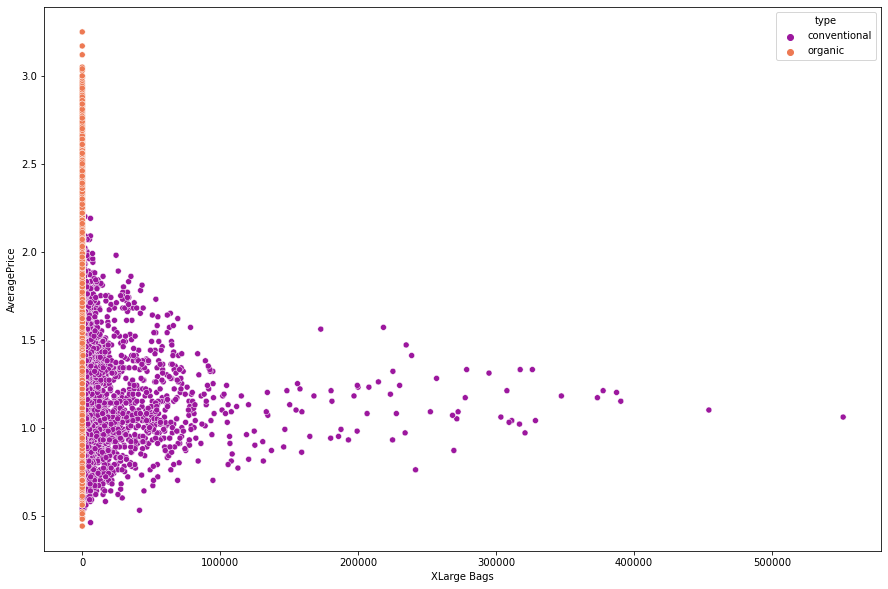

In [210]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='XLarge Bags', y='AveragePrice', hue='type', data=data, palette="plasma")
plt.show()

In [ ]:
#we are able to see positive linear relationship between the Xlargebags and Avg price.the data is more denser at totla volume is on range of zero to 100000 unit and as the Xlargebags increase we are able to see increase in the datapoints in the Avg price as well

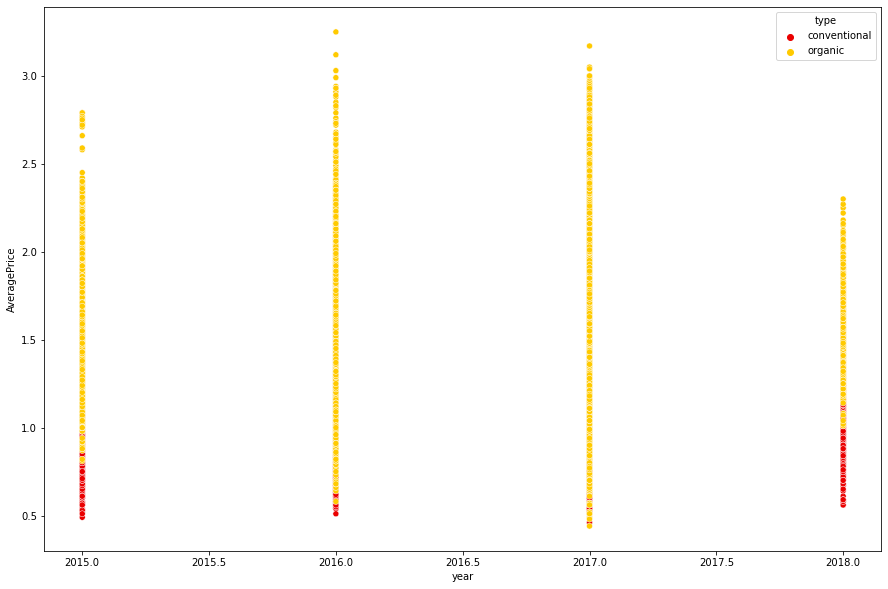

In [211]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='year', y='AveragePrice', hue='type', data=data, palette="hot")
plt.show()

In [ ]:
#there is no linear relation between the region and types of year data .

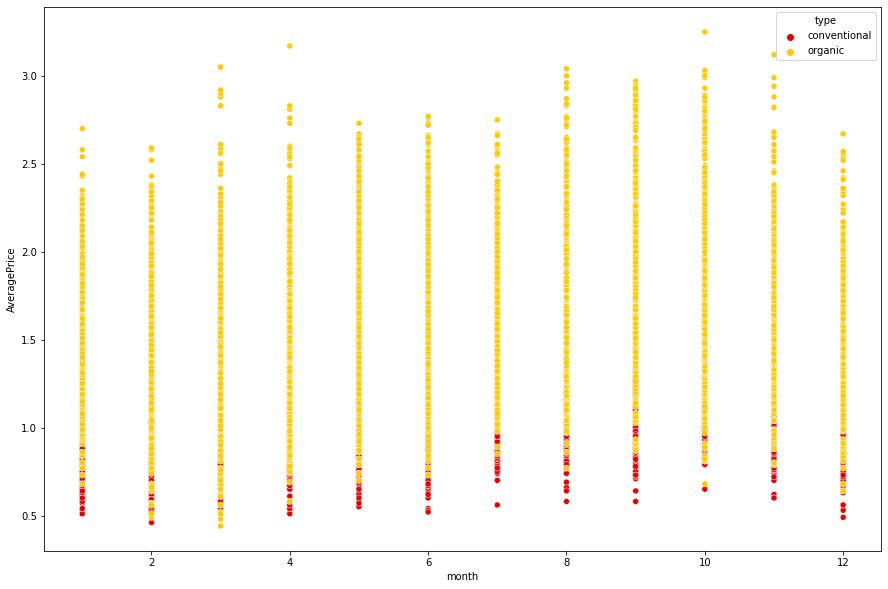

In [212]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='month', y='AveragePrice', hue='type', data=data, palette="hot")
plt.show()

In [ ]:
#there is no linear relation between the conventional and organic types of data and data is distributed on therese 2 types

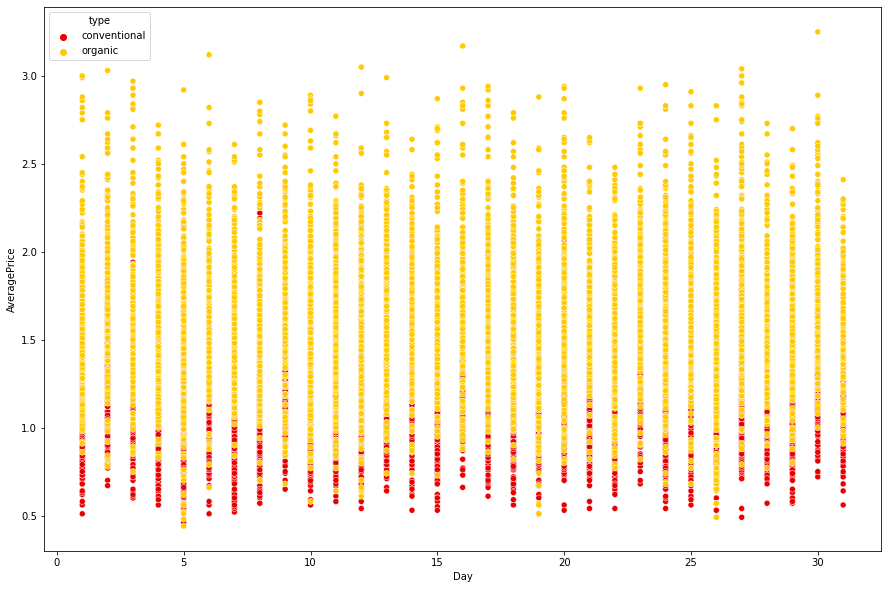

In [213]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='Day', y='AveragePrice', hue='type', data=data, palette="hot")
plt.show()

In [ ]:
#there is no linear relation between the conventional and organic types of data and data is distributed on therese 2 types

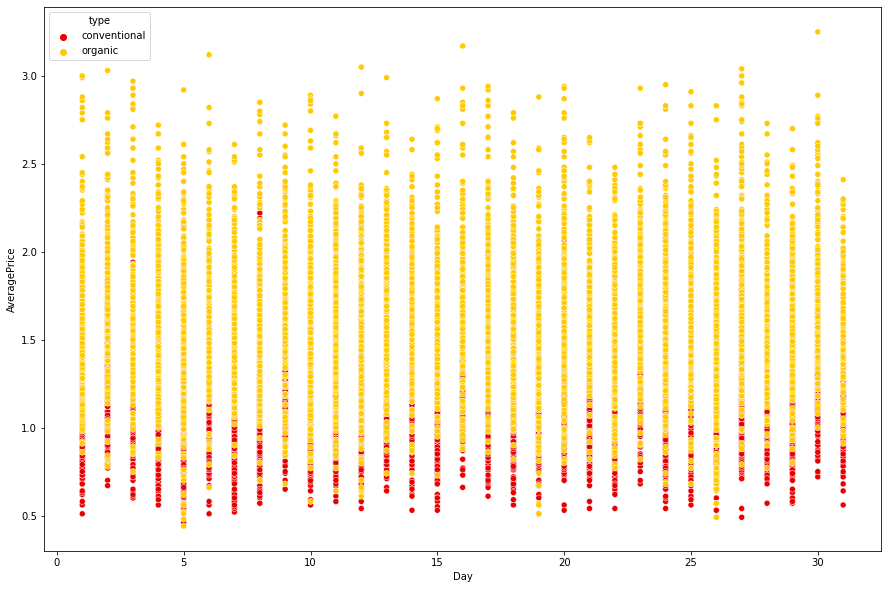

In [214]:

plt.figure(figsize=(15,10))
sns.scatterplot(x='Day', y='AveragePrice', hue='type', data=data, palette="hot")
plt.show()

In [ ]:
#there is no linear relation between the region and types of day data .

conventional    9126
organic         9123
Name: type, dtype: int64


<AxesSubplot:xlabel='type', ylabel='count'>

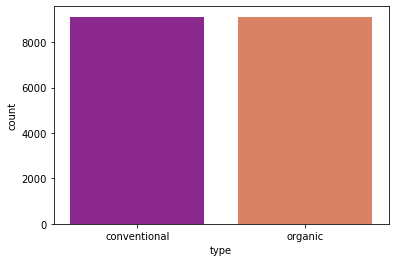

In [257]:
print(df['type'].value_counts())
sns.countplot(x='type',data=df,palette='plasma')

In [ ]:
#we are able to observe conventional type has 9126 data and organic tupe has 9123 data.We can see more data in the conventional type here

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64


<AxesSubplot:xlabel='year', ylabel='count'>

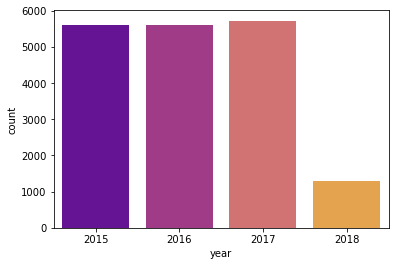

In [258]:
print(df['year'].value_counts())
sns.countplot(x='year',data=df,palette='plasma')

In [ ]:
#we are able to observe in the year 2015 we have 5615 data available and in 2016 we have 5616 data available and in 2017 we have 5722 data available and in 2018 we have only 1296 data available.for each year except the 2018 they are having count more than 5600.

1     1944
3     1836
2     1728
10    1512
7     1512
5     1512
11    1404
8     1404
4     1404
12    1403
9     1296
6     1294
Name: month, dtype: int64


<AxesSubplot:xlabel='month', ylabel='count'>

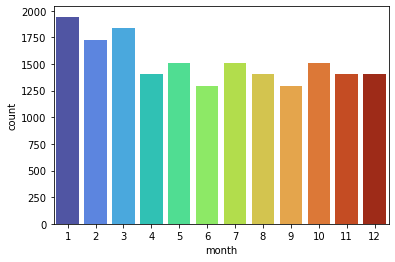

In [259]:
print(df['month'].value_counts())
sns.countplot(x='month',data=df,palette='turbo')

In [ ]:
#we are able to observe large count of 1944 in 1st month and least 1294 in 6th month .we are able to observe data more than 1290+ in the dataset.We can see gradual reduction and increase in the dataset in each month interval

4     756
11    756
18    755
25    755
1     648
26    648
5     648
12    648
3     648
8     648
15    648
22    648
24    648
17    648
10    648
19    648
7     540
14    540
21    540
28    540
27    540
20    540
29    540
13    540
6     539
2     432
9     432
23    432
30    432
31    432
16    432
Name: Day, dtype: int64


<AxesSubplot:xlabel='Day', ylabel='count'>

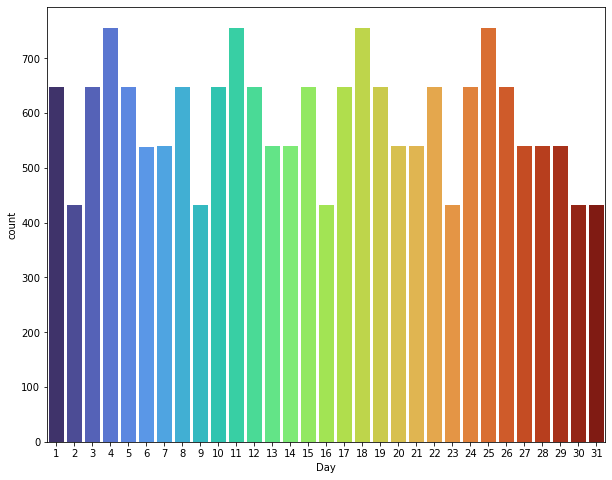

In [260]:
print(df['Day'].value_counts())
plt.figure(figsize=(10,8))
sns.countplot(x='Day',data=df,palette='turbo')

In [ ]:
#we are able to observe large count in 4th day with 756 and least in 16th day with 432.We are able to see the count is more than 400 in almost all the days in the dataset.

<Figure size 1080x720 with 0 Axes>

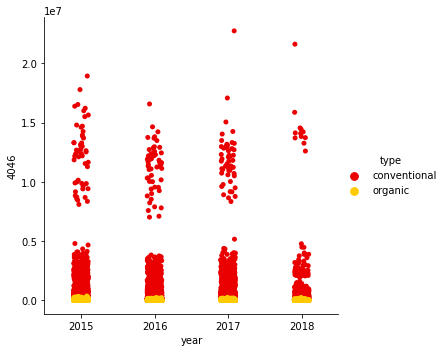

In [261]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4046", hue="type", data=df, palette="hot")
plt.show()

In [ ]:
#able to observe large no of data in conventional data in years 2015 and 2016 and 2017 and 2018 years with 4046 sales compared to the organic data type.

<Figure size 1080x720 with 0 Axes>

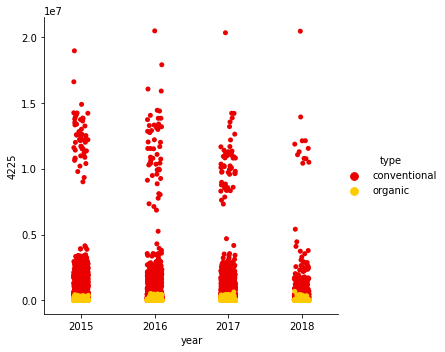

In [262]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4225", hue="type", data=df, palette="hot")
plt.show()

In [ ]:
#able to observe large no of data in conventional data in years 2015 and 2016 and 2017 and 2018 years with 4225 sales compared to the organic data type.the most sale are taking place in year 2016

<Figure size 1080x720 with 0 Axes>

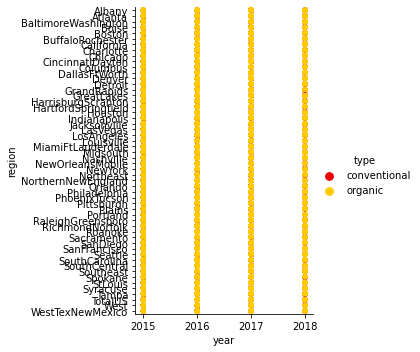

In [263]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="region", hue="type", data=df, palette="hot")
plt.show()

In [ ]:
#we are able to uniform data along the different years and the data is more denser on the organic when compared to conventional.

<Figure size 1080x720 with 0 Axes>

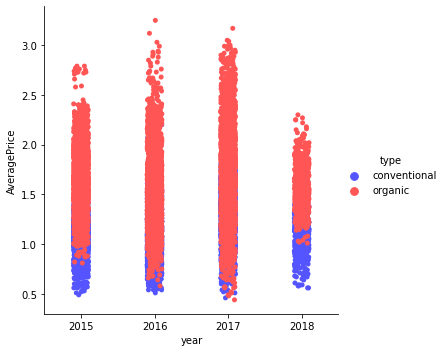

In [264]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="AveragePrice", hue="type", data=df, palette="seismic")
plt.show()

In [ ]:
#with the help of this catplot we can see that how organic Average price is more than conventional year after year

<Figure size 1080x720 with 0 Axes>

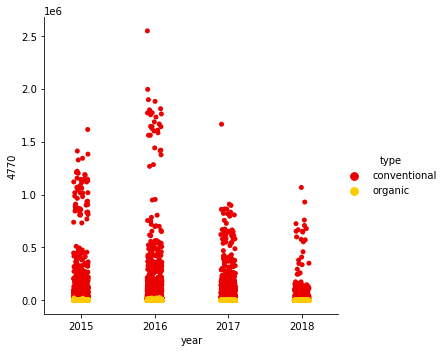

In [265]:
plt.figure(figsize=(15,10))
sns.catplot(x="year", y="4770", hue="type", data=df, palette="hot")
plt.show()

In [ ]:
#we are able to see that the the total volume increases along the year .The least total volume is on year 2015 for conventional and max on year 2018. for organinc The least total volume is on year 2015 and max on year 2018 in the dataset

<Figure size 1080x720 with 0 Axes>

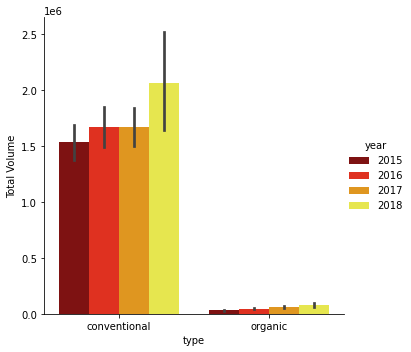

In [266]:
plt.figure(figsize=(15,10))
sns.catplot(x="type", y="Total Volume", hue="year", kind="bar", data=df, palette="hot")
plt.show()

In [ ]:
#we are able to see that the the total volume increases along the year .The least total volume is on year 2015 for conventional and max on year 2018. for organinc The least total volume is on year 2015 and max on year 2018 in the dataset

<Figure size 1080x720 with 0 Axes>

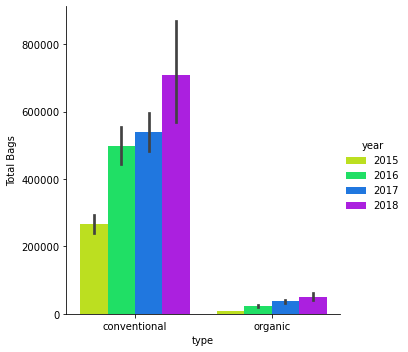

In [267]:
plt.figure(figsize=(15,10))
sns.catplot(x="type", y="Total Bags", hue="year", data=df, kind="bar", palette="hsv")
plt.show()

In [ ]:
#we are able to observe the Totalbags increase with each year for both conventional and organic.The conentional has more total bags data compared to organic

# Encoding

In [268]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()

In [269]:
data.type=LE.fit_transform(data.type)
data.region=LE.fit_transform(data.region)

In [215]:
def pplot(i):
    plt.figure(figsize=(10,9))
    sns.regplot(x=columns[i],y='AveragePrice',data=data)    
    plt.xlabel(columns[i])
    plt.show()

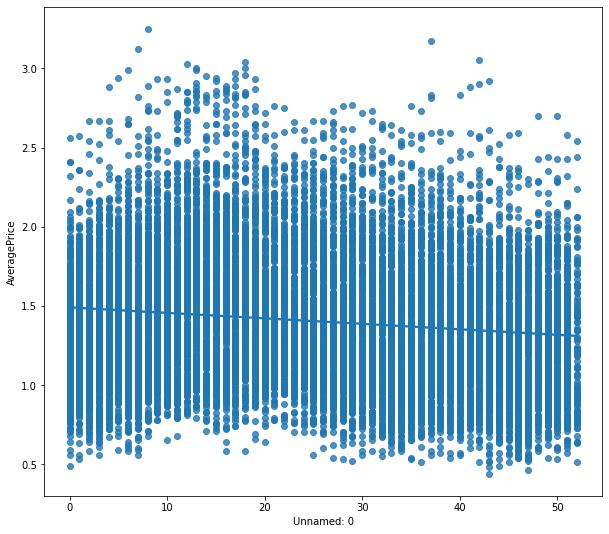

In [216]:
pplot(0)

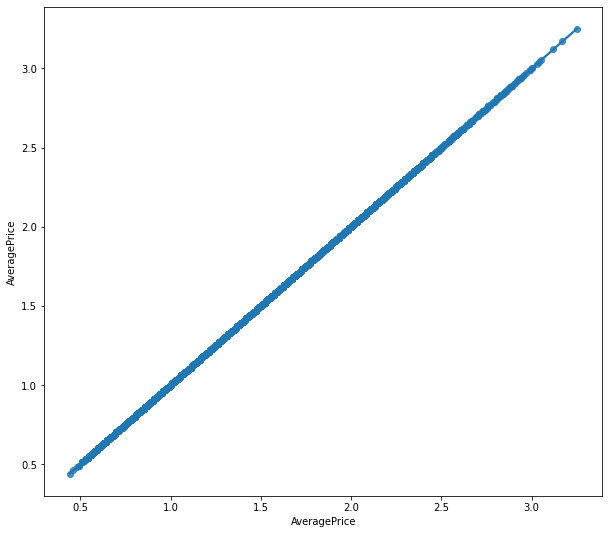

In [217]:
pplot(1)

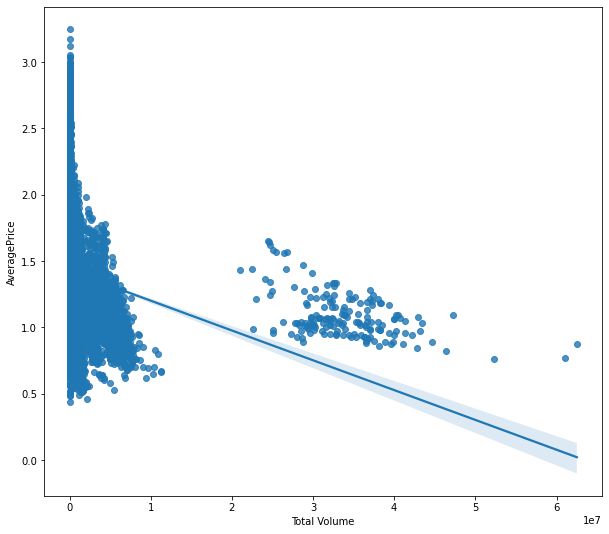

In [218]:
pplot(2)

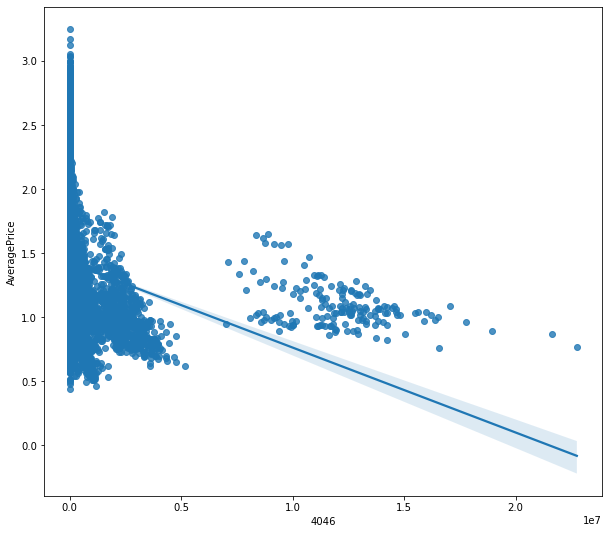

In [219]:
pplot(3)

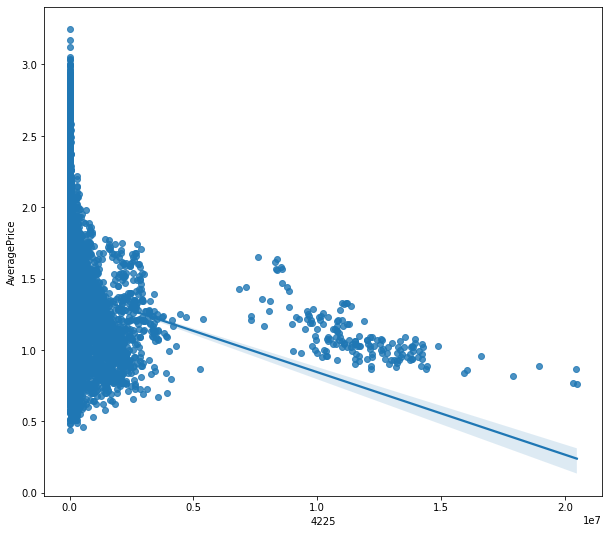

In [220]:
pplot(4)

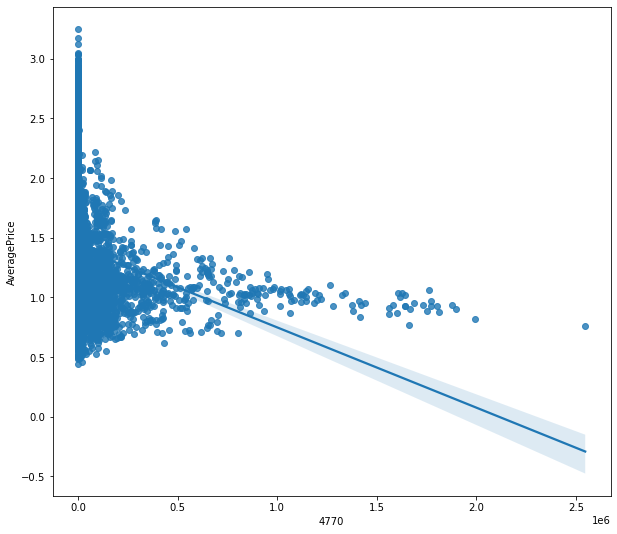

In [221]:
pplot(5)

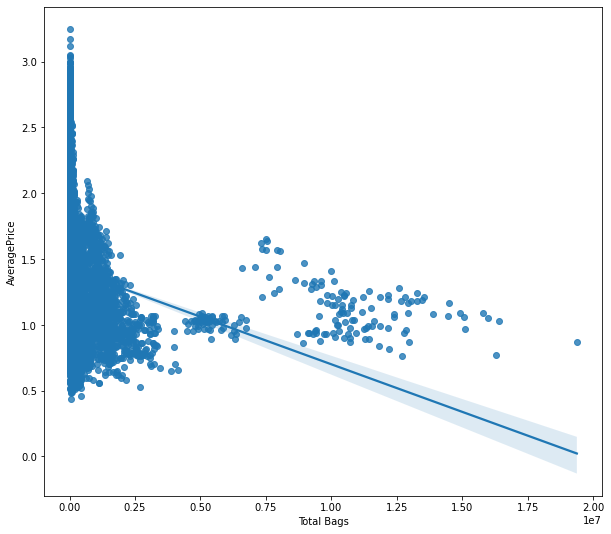

In [222]:
pplot(6)

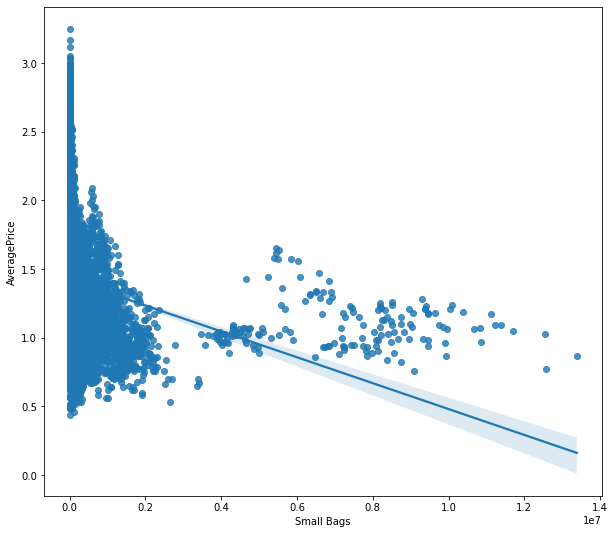

In [223]:
pplot(7)

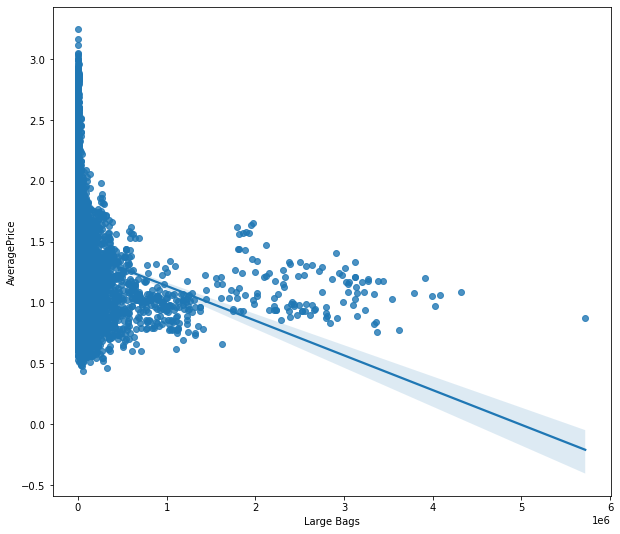

In [224]:
pplot(8)

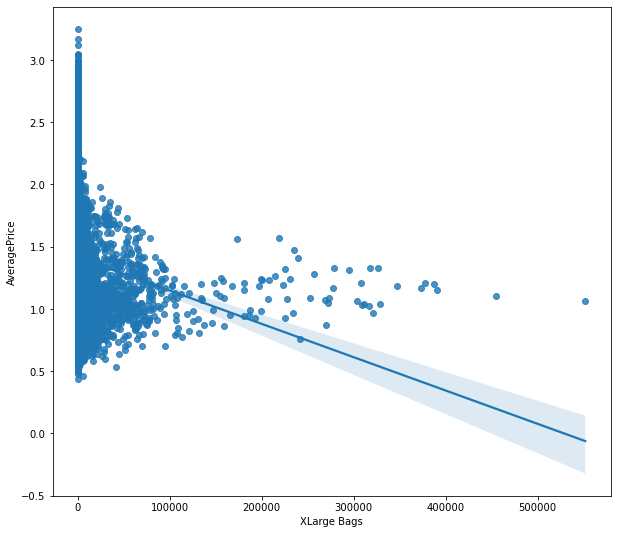

In [225]:
pplot(9)

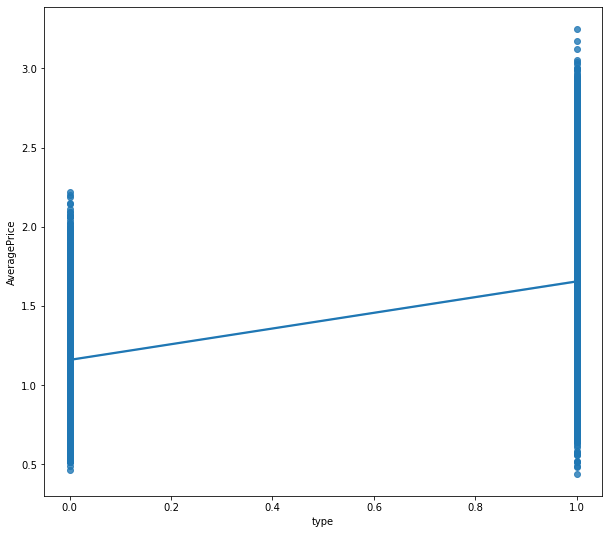

In [270]:
pplot(10)

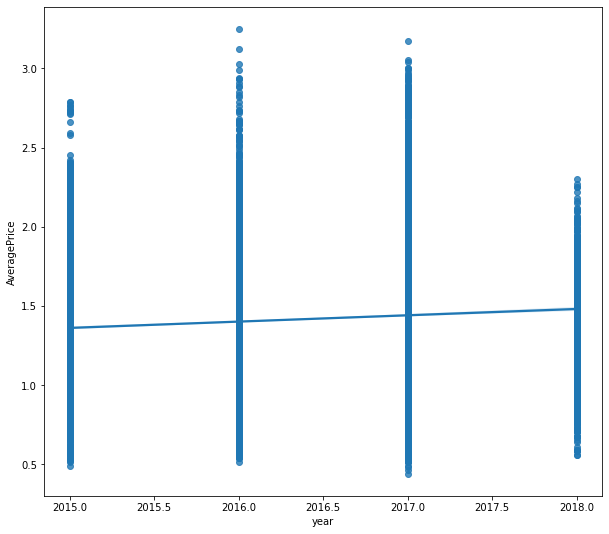

In [227]:
pplot(11)

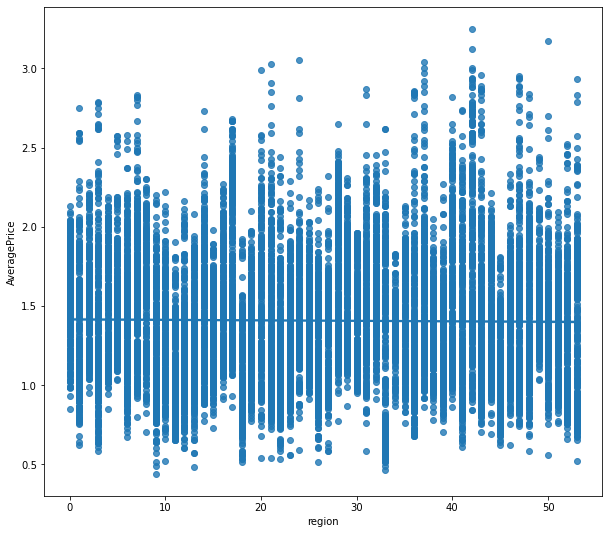

In [271]:
pplot(12)

In [231]:
data.columns

Index(['Unnamed: 0', 'AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year',
       'region', 'month', 'Day'],
      dtype='object')

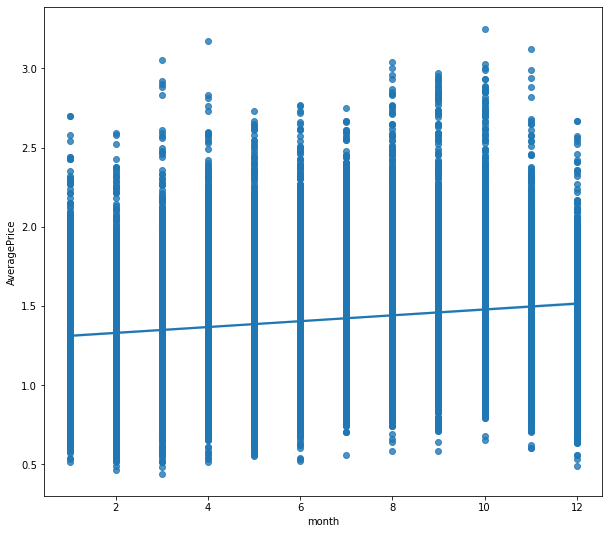

In [229]:
pplot(13)

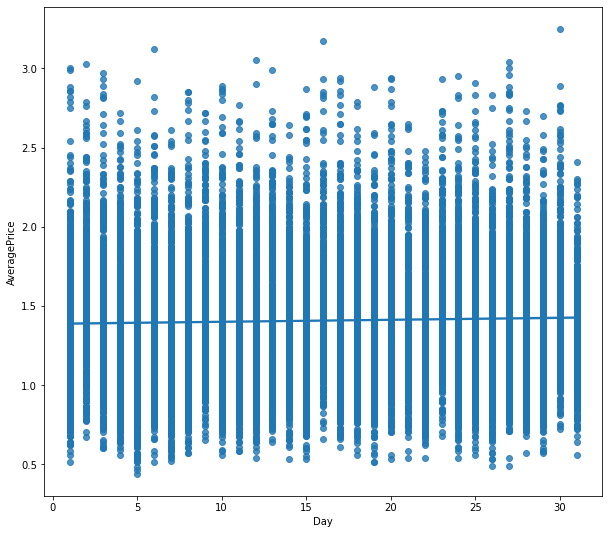

In [230]:
pplot(14)

In [245]:
def dtp(a):
    plt.figure()
    sns.distplot(data[columns[a]],color='green',bins=8)

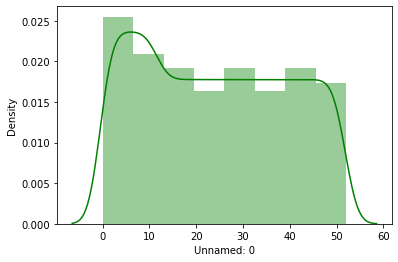

In [246]:
dtp(0)

#normal distrinution of the dataset is being observed.

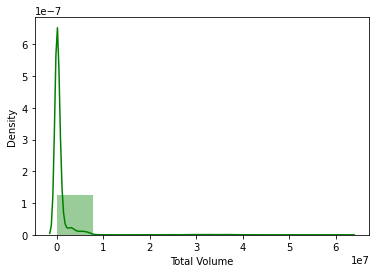

In [248]:
dtp(2)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

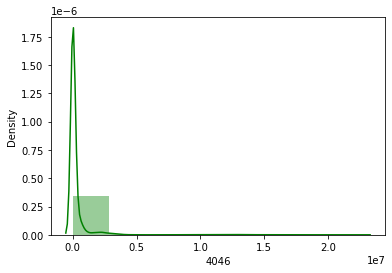

In [249]:
dtp(3)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

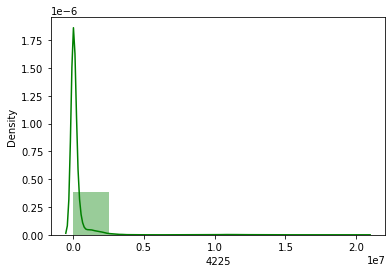

In [250]:
dtp(4)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

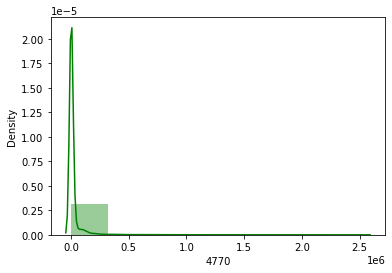

In [251]:
dtp(5)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

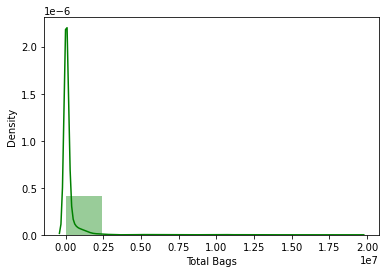

In [252]:
dtp(6)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

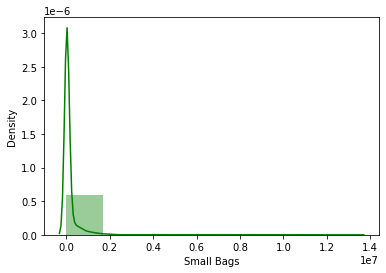

In [253]:
dtp(7)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

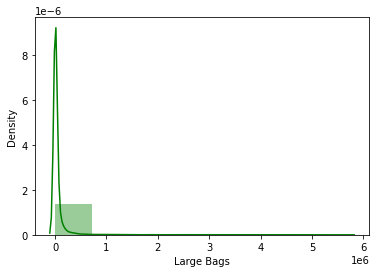

In [254]:
dtp(8)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

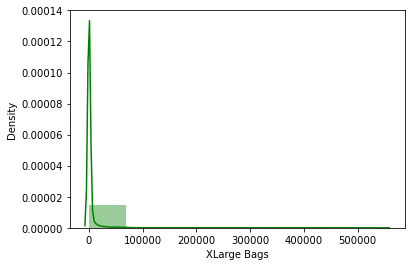

In [255]:
dtp(9)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve

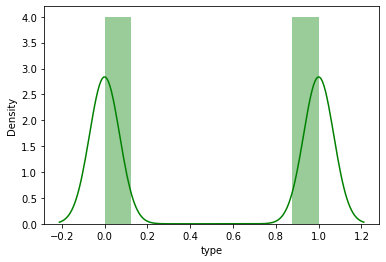

In [272]:
dtp(10)

In [ ]:
#The data looks skewed.The building block is out of the normalised curve

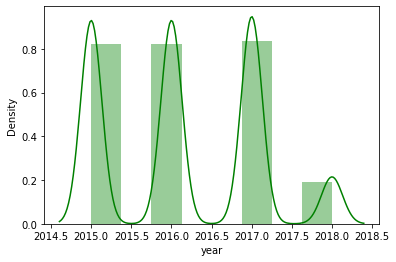

In [273]:
dtp(11)

In [ ]:
#The data looks skewed.The building block is out of the normalised curve

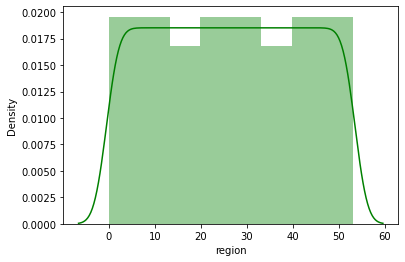

In [274]:
dtp(12)

In [ ]:
#normal distrinution of the dataset is being observed.

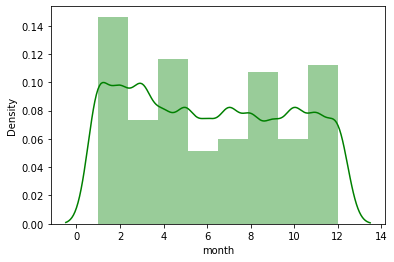

In [275]:
dtp(13)

In [ ]:
#normal distrinution of the dataset is being observed.

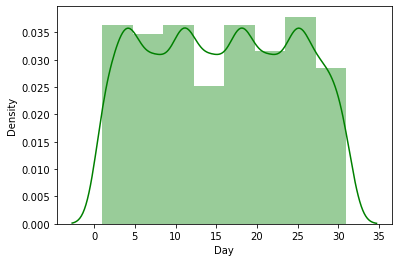

In [276]:
dtp(14)

In [ ]:
#normal distrinution of the dataset is being observed.

<Figure size 4320x2160 with 0 Axes>

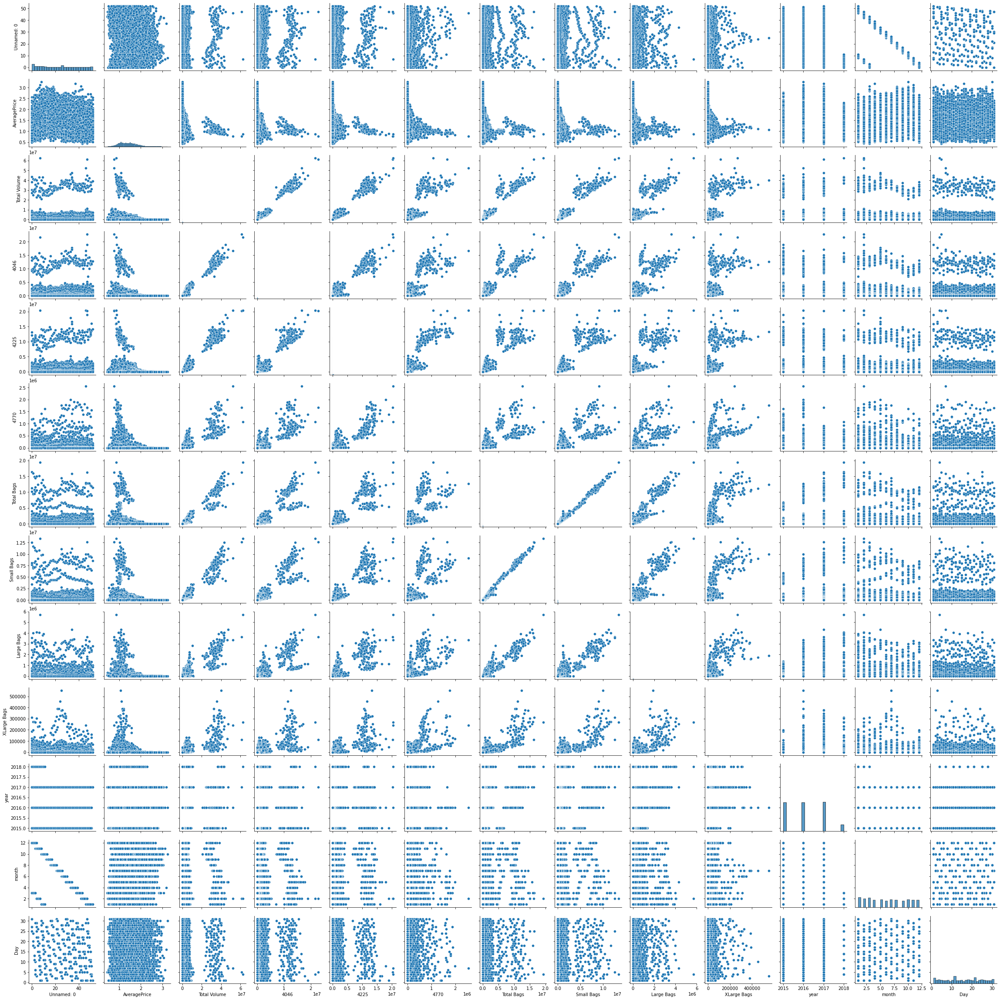

In [277]:
plt.figure(figsize=(60,30))
sns.pairplot(df)

In [ ]:
#we are able to see positive relation among almost all of the columns in the dataset

# Detecting Outliers

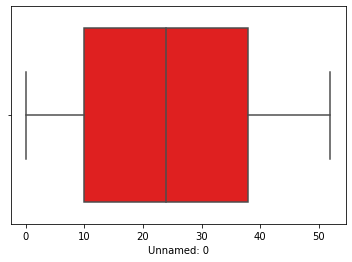

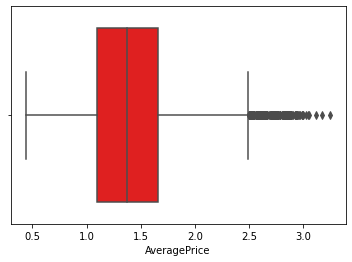

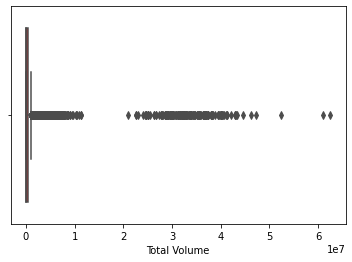

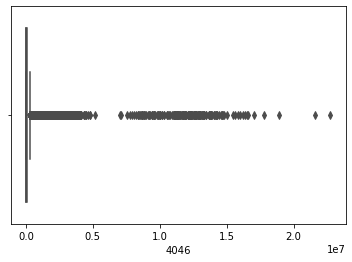

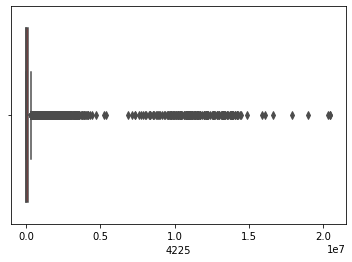

...

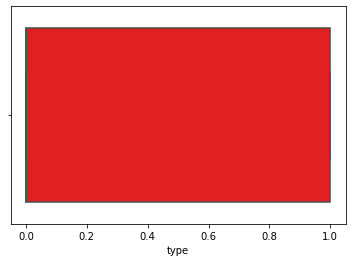

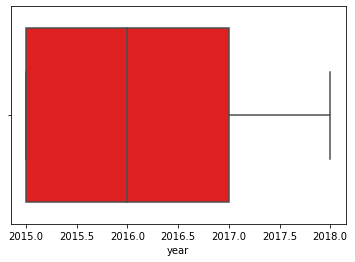

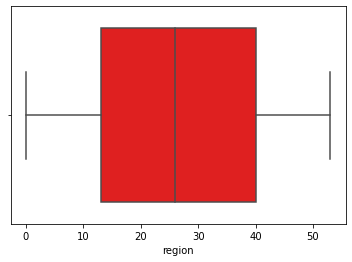

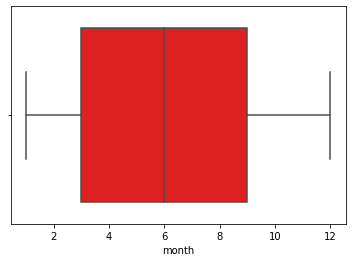

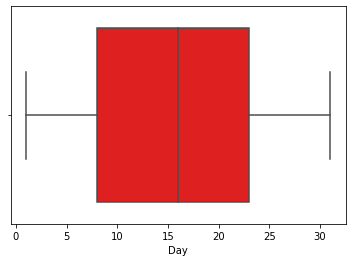

In [278]:
def bxplt(a):
    plt.figure()
    sns.boxplot(data[columns[a]],data=data,color='red')
    
for i in range(0,15):
    bxplt(i)

In [ ]:
#we are able to observe the outliers in Average price and total volume and 4046 and 4225 and 4770 and total bags and small bags and large bags and xlarge bags and

# Removing outliers

In [279]:
z1=np.abs(zscore(data))
z1

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,Day
0,1.565327,0.188689,0.227716,0.230816,0.199902,0.212091,0.234170,0.232647,0.222352,0.17558,0.999836,1.221282,1.700252,1.647632,1.291857
1,1.500730,0.139020,0.230427,0.231103,0.208054,0.211997,0.233350,0.231568,0.222335,0.17558,0.999836,1.221282,1.700252,1.647632,0.494231
2,1.436133,1.182069,0.212085,0.231007,0.154478,0.211325,0.234730,0.233399,0.222311,0.17558,0.999836,1.221282,1.700252,1.647632,0.303396
3,1.371536,0.809551,0.223444,0.230741,0.185350,0.211864,0.237096,0.236568,0.222186,0.17558,0.999836,1.221282,1.700252,1.647632,1.101022
4,1.306939,0.312861,0.231538,0.230891,0.208719,0.211834,0.236718,0.236154,0.221924,0.17558,0.999836,1.221282,1.700252,1.364669,1.519750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.113149,0.556347,0.241373,0.230017,0.243857,0.212540,0.229301,0.226665,0.220964,0.17558,1.000164,1.970504,1.700811,1.181997,1.328915
18245,1.048552,0.755023,0.242296,0.230693,0.242277,0.212540,0.233594,0.232196,0.221403,0.17558,1.000164,1.970504,1.700811,1.464959,1.405803
18246,0.983955,1.152375,0.242331,0.230693,0.243090,0.205766,0.233463,0.231644,0.222561,0.17558,1.000164,1.970504,1.700811,1.464959,0.608177
18247,0.919358,1.301382,0.241625,0.230428,0.242651,0.205774,0.231866,0.229543,0.222529,0.17558,1.000164,1.970504,1.700811,1.464959,0.189449


In [280]:
threshold=3
print(np.where(z1>3))

(array([  346,   359,   780, ..., 17304, 17402, 17428], dtype=int64), array([3, 3, 9, ..., 1, 1, 1], dtype=int64))


In [281]:
df_new2=data[(z1<3).all(axis=1)]

In [282]:
#chcking data loss
data_loss=((data.shape[0]-df_new2.shape[0])/data.shape[0])*100
print(data_loss)

3.276891884486821


since data loss is less than 5% it is allowable and we can go with the dataset

In [284]:
#saving the upadated dataset 
df1=df_new2

# Skewness Removal

In [318]:
#initialising x and y
X=df1.drop(['AveragePrice'],axis=1)
y=df1.AveragePrice

In [319]:
X.shape

(17651, 14)

In [320]:
X.skew().sort_values(ascending=False)

XLarge Bags     6.135607
4770            5.117170
Large Bags      5.053434
4046            4.909848
4225            4.455745
Small Bags      4.222706
Total Bags      4.066771
Total Volume    3.767138
year            0.229976
month           0.107408
Unnamed: 0      0.106116
region          0.012798
Day             0.011778
type           -0.037741
dtype: float64

we are able to see skewness in the columns XLarge Bags,4770,Large Bags,4046,4225,Small Bags,Total Bags,Total Volume

In [321]:
X['XLarge Bags']=PowerTransformer().fit_transform(X['XLarge Bags'].values.reshape(-1,1))
X['Large Bags']=PowerTransformer().fit_transform(X['Large Bags'].values.reshape(-1,1))
X['Small Bags']=PowerTransformer().fit_transform(X['Small Bags'].values.reshape(-1,1))
X['4046']=PowerTransformer().fit_transform(X['4046'].values.reshape(-1,1))
X['4225']=PowerTransformer().fit_transform(X['4225'].values.reshape(-1,1))
X['4770']=PowerTransformer().fit_transform(X['4770'].values.reshape(-1,1))
X['Total Bags']=PowerTransformer().fit_transform(X['Total Bags'].values.reshape(-1,1))
X['Total Volume']=PowerTransformer().fit_transform(X['Total Volume'].values.reshape(-1,1))


In [322]:
X.skew().sort_values(ascending=False)

XLarge Bags     0.853758
year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
region          0.012798
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
dtype: float64

Skewness is treated. It is in range -0.5 to 0.5 except XLarge Bags column .

In [323]:
X['XLarge Bags']=np.sqrt(X['XLarge Bags'].values.reshape(-1,1))

In [324]:
X.skew().sort_values(ascending=False)

year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
region          0.012798
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
XLarge Bags    -2.492399
dtype: float64

In [325]:
X['XLarge Bags']=np.cbrt(X['XLarge Bags'].values.reshape(-1,1))

In [326]:
X.skew().sort_values(ascending=False)

year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
region          0.012798
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
XLarge Bags    -3.532746
dtype: float64

<AxesSubplot:xlabel='XLarge Bags', ylabel='Density'>

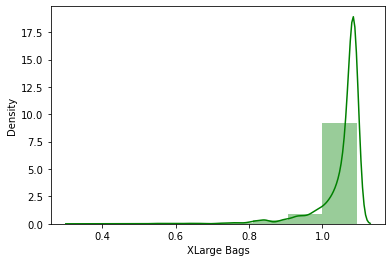

In [327]:
sns.distplot(X['XLarge Bags'],color='green',bins=8)

We are unable to reduce the skewness for 'XLarge Bags' so we have to drop that column

In [328]:
X.drop('XLarge Bags',axis=1,inplace=True)

In [329]:
X.skew().sort_values(ascending=False)

year            0.229976
month           0.107408
Unnamed: 0      0.106116
4770            0.024168
region          0.012798
Day             0.011778
Total Volume   -0.008642
Total Bags     -0.022204
Small Bags     -0.024405
type           -0.037741
4046           -0.039282
4225           -0.044675
Large Bags     -0.110913
dtype: float64

# Feature selection

In [330]:
from sklearn.feature_selection import SelectKBest,f_classif

In [331]:
best_features = SelectKBest(score_func=f_classif ,k=12)

fit = best_features.fit(X,y)
df_scores_1 = pd.DataFrame(fit.scores_)
df_columns_1 =pd.DataFrame(X.columns)
#concatenate dataframes

features_scores_1 =pd.concat([df_columns_1,df_scores_1],axis=1 )
features_scores_1

,0,0
0,Unnamed: 0,2.877634
1,Total Volume,46.978329
2,4046,43.225502
3,4225,25.788168
4,4770,32.587031
5,Total Bags,41.737124
6,Small Bags,28.902980
7,Large Bags,27.529537
8,type,58.944331
9,year,3.556888


In [332]:
features_scores.columns = ['Feature_Name','Score']  #Name o/p col
print(features_scores.nlargest(13,'Score'))

    Feature_Name      Score
8           type  53.269112
1   Total Volume  42.673739
2           4046  38.528651
5     Total Bags  38.331344
4           4770  30.629159
6     Small Bags  26.956668
7     Large Bags  25.382312
3           4225  23.933406
9           year   3.056698
11         month   3.051554
0     Unnamed: 0   2.720172
10        region   1.334940
12           Day   1.284083


# scaling the dataset

In [333]:
scaler=StandardScaler()

<AxesSubplot:>

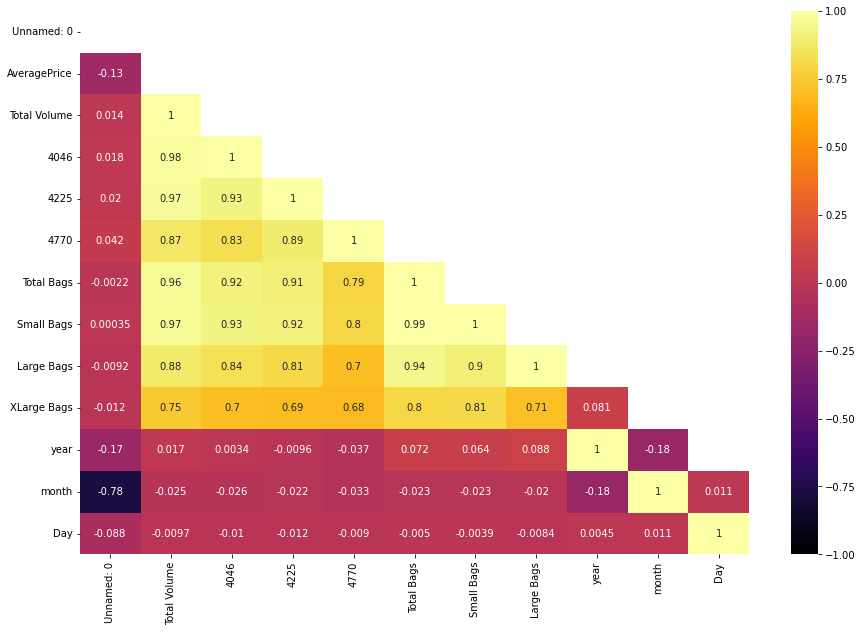

In [334]:
D=df.corr().drop(['XLarge Bags','AveragePrice'],axis=1)
upper_triangle = np.triu(D)
plt.figure(figsize=(15,10))
sns.heatmap(D , vmin=-1, vmax=1, annot=True,cmap="inferno", mask=upper_triangle)

In [335]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,3.513545,Unnamed: 0
1,53.551207,Total Volume
2,7.181620,4046
3,11.326489,4225
4,3.887046,4770
5,35.250736,Total Bags
6,16.642940,Small Bags
7,3.458067,Large Bags
8,3.357338,type
9,1.732009,year


we are able to see Total Volume,Total Bags,Small Bags  having vif greater than 10 so we need to drop it iteratively.see the values

In [336]:
X.drop('Total Volume',axis=1,inplace=True)

In [337]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,3.510672,Unnamed: 0
1,3.740106,4046
2,4.326777,4225
3,3.867778,4770
4,24.661598,Total Bags
5,16.640681,Small Bags
6,3.411903,Large Bags
7,3.180210,type
8,1.724247,year
9,1.075946,region


In [338]:
X.drop('Total Bags',axis=1,inplace=True)

In [339]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,3.498494,Unnamed: 0
1,3.718698,4046
2,4.170361,4225
3,3.867320,4770
4,4.126743,Small Bags
5,1.874264,Large Bags
6,3.177497,type
7,1.686303,year
8,1.075906,region
9,3.502070,month


No multicollinearity now. Removed all the multicollinear columns. Now we can fit the datas to model and check score

# Model Building

In [340]:
#X,y already initialized
X.shape

(17651, 11)

In [341]:
y.shape

(17651,)

In [372]:
#imprting libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score


In [349]:
#finding best random_state

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.25,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    r2=r2_score(y_test,predrf)
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)

Best accuracy is  0.5348227379311228  on random_state  6


In [351]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.25,random_state=6)

In [352]:
#shapes of x and y (train,test)
x_train.shape

(13238, 11)

In [353]:
#shape of test features
x_test.shape

(4413, 11)

In [354]:
#shape of train features
y_train.shape

(13238,)

In [355]:
#shape of test label
y_test.shape

(4413,)

In [374]:
# different algorithm going to use

lr=LinearRegression()
Rd=Ridge()
dtr=DecisionTreeRegressor()
rfr=RandomForestRegressor(n_estimators=100)
adr=AdaBoostRegressor(n_estimators=100)
knn=KNeighborsRegressor()
gbr=GradientBoostingRegressor()
xgb=XGBRegressor()

In [357]:
#code for Training and Prediction for linear,lasso,Ridge regression
def evaluate(x):
    mod=x
    mod.fit(x_train,y_train)
    pred_train=mod.predict(x_train)
    pred_test=mod.predict(x_test)
    

    print("r2_score for train data is {:.2f}%".format(r2_score(y_train,pred_train)*100),"\n")
    print("r2_score for  test data is  {:.2f}%".format(r2_score(y_test,pred_test)*100),"\n")
    print("intercept is : ",mod.intercept_,"\n")
    print("Coefficient is  : ",mod.coef_,"\n")
    print("Score of trained data :",mod.score(x_train,y_train)*100,"\n")
    print("Score of test data :",mod.score(x_test,y_test)*100,"\n")
    
    print("Error")
    print("mean absolute error is : ",mean_absolute_error(y_test,pred_test))
    print("mean squared error is: ",mean_squared_error(y_test,pred_test))
    print("root mean squared error is: ",np.sqrt(mean_squared_error(y_test,pred_test)))
    plt.scatter(x=y_test,y=pred_test,color='r')
    plt.plot(y_test,y_test,color='b')

In [364]:
#code for Training and Prediction for other models

def eval(x):
    mod=x
    print(mod)
    #training the data
    mod.fit(x_train,y_train)
    #Predicting the data
    pred_train=mod.predict(x_train)
    pred=mod.predict(x_test)
    
    print("r2_score for train data is {:.2f}%".format(r2_score(y_train,pred_train)*100))
    print("\n")
    print("r2_score for  test data is  {:.2f}%".format(r2_score(y_test,pred)*100))
    
    print("\n")
    print("Error")
    print("mean absolute error : ",mean_absolute_error(y_test,pred))
    print("mean squared error : ",mean_squared_error(y_test,pred))
    print("mean squared error is: ",np.sqrt(mean_squared_error(y_test,pred)))
    plt.scatter(x=y_test,y=pred,color='r')
    plt.plot(y_test,y_test,color='b')
    
   

r2_score for train data is 50.78% 

r2_score for  test data is  53.48% 

intercept is :  1.4060168932762371 

Coefficient is  :  [ 0.04889906 -0.06266715  0.12515181  0.03921152 -0.06545593 -0.12686902
  0.20288061  0.10180684  0.01586939  0.11550587  0.01225225] 

Score of trained data : 50.78167438657732 

Score of test data : 53.48227379311228 

Error
mean absolute error is :  0.2096269993778442
mean squared error is:  0.07075346885319284
root mean squared error is:  0.26599524216269893


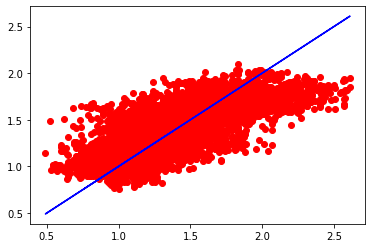

In [358]:
#calling Ridge model
evaluate(lr)

r2_score for train data is 50.78% 

r2_score for  test data is  53.48% 

intercept is :  1.4060169698169316 

Coefficient is  :  [ 0.04885042 -0.06267218  0.12508659  0.03917973 -0.06542302 -0.12683881
  0.20282672  0.10176732  0.01586865  0.11545062  0.01224711] 

Score of trained data : 50.78167239979254 

Score of test data : 53.48200224290537 

Error
mean absolute error is :  0.2096259149932413
mean squared error is:  0.07075388188110013
root mean squared error is:  0.2659960185436995


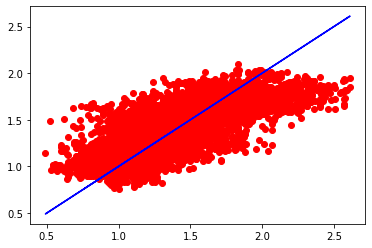

In [359]:
#calling Ridge model
evaluate(Rd)

DecisionTreeRegressor()
r2_score for train data is 100.00%


r2_score for  test data is  77.12%


Error
mean absolute error :  0.12126444595513255
mean squared error :  0.03479891230455472
mean squared error is:  0.18654466570919342


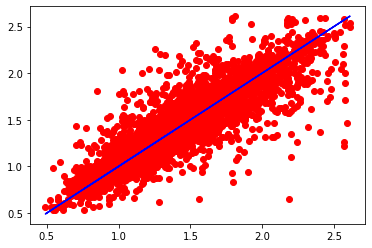

In [365]:
#calling DecisionTreeRegressor model
eval(dtr)

RandomForestRegressor()
r2_score for train data is 98.38%


r2_score for  test data is  89.00%


Error
mean absolute error :  0.08895646952186718
mean squared error :  0.016737052741898933
mean squared error is:  0.12937176176391404


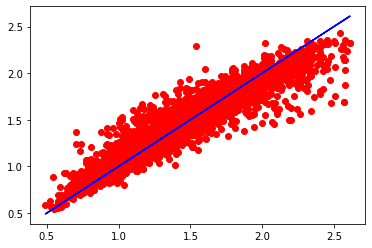

In [366]:
# RandomForestRegressor model
eval(rfr)

AdaBoostRegressor(n_estimators=100)
r2_score for train data is 56.12%


r2_score for  test data is  56.19%


Error
mean absolute error :  0.2090950766254193
mean squared error :  0.06662925966182612
mean squared error is:  0.258126441229538


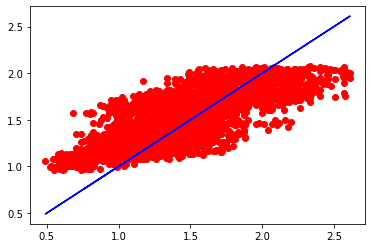

In [367]:
#calling AdaBoostRegressor model
eval(adr) 

KNeighborsRegressor()
r2_score for train data is 87.07%


r2_score for  test data is  80.31%


Error
mean absolute error :  0.12503331067301154
mean squared error :  0.029944409698617717
mean squared error is:  0.17304453096997235


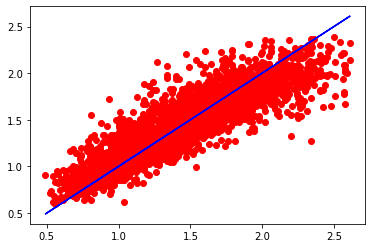

In [368]:
#calling KNeighborsRegressor model
eval(knn)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)
r2_score for train data is 96.27%


r2_score for  test data is  89.94%


Error
mean absolute error :  0.09077638183109026
mean squared error :  0.015300321456130885
mean squared error is:  0.12369446817109844


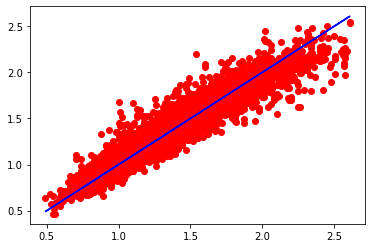

In [376]:
#calling XGBRegressor
eval(xgb)

GradientBoostingRegressor()
r2_score for train data is 75.01%


r2_score for  test data is  74.48%


Error
mean absolute error :  0.15005535013985427
mean squared error :  0.03881430672041852
mean squared error is:  0.1970134683731509


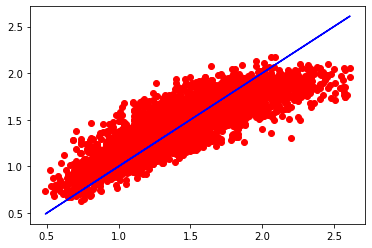

In [369]:
#calling GradientBoostingRegressor model
eval(gbr)

In [377]:
from numpy import absolute
model=[lr,dtr,rfr,adr,knn,gbr,Rd,xgb]
for m in model:
    score=cross_val_score(m,X,y,cv=5,scoring="r2")
    print(m,"Cross val score is ",score*100)
    score=absolute(score)
    print("mean is ",score.mean()*100,"\n\n")

LinearRegression() Cross val score is  [-42.10433446  15.8687185   39.44906867  15.6575293   18.93367091]
mean is  26.40266436695694 


DecisionTreeRegressor() Cross val score is  [-88.88388973   6.16153196  24.46237172 -77.71845378 -38.58447184]
mean is  47.162143807171105 


RandomForestRegressor() Cross val score is  [-20.61403069  49.01754201  61.01730362  20.77826315   6.05909208]
mean is  31.497246308614756 


AdaBoostRegressor(n_estimators=100) Cross val score is  [-94.79732302  32.9120976   51.23812785   9.02094269  16.21800379]
mean is  40.83729899150305 


KNeighborsRegressor() Cross val score is  [-45.76454795  26.22652525  37.78263628   5.79355546  -2.3481398 ]
mean is  23.583080949053926 


GradientBoostingRegressor() Cross val score is  [ 8.28087914 58.52023949 63.05341389 31.99239457 23.97945189]
mean is  37.16527579690049 


Ridge() Cross val score is  [-42.1048186   15.87190527  39.45627115  15.65555044  18.93272606]
mean is  26.40425430398817 


XGBRegressor(base_scor

we can see that the model is underfitting .The least difference between test accuracy and cross validation is less for AdaBoostRegressor model.

lets do hypertuning on the AdaBoostRegressor model.

In [378]:
adr.get_params()

{'base_estimator': None,
 'learning_rate': 1.0,
 'loss': 'linear',
 'n_estimators': 100,
 'random_state': None}

In [379]:
grid={'base_estimator':[object,None],
        'n_estimators':np.arange(10,100,5),
        'learning_rate':np.arange(0.01,1,.1),
        'loss':['linear','square','exponential'],
        'random_state':[int, None]}
grid_search = GridSearchCV(adr, grid, scoring='r2', cv=5, n_jobs=-1)

In [381]:
grid_search.fit(X, y)
grid_search.best_params_

{'base_estimator': None,
 'learning_rate': 0.7100000000000001,
 'loss': 'linear',
 'n_estimators': 10,
 'random_state': None}

In [404]:
h_adr=AdaBoostRegressor(base_estimator=None,n_estimators=10,learning_rate=0.7100000000000001,loss='linear',random_state=None)

AdaBoostRegressor(learning_rate=0.7100000000000001, n_estimators=10)
r2_score for train data is 53.13%


r2_score for  test data is  54.21%


Error
mean absolute error :  0.2084909579365882
mean squared error :  0.06964437617974942
mean squared error is:  0.2639022095014542


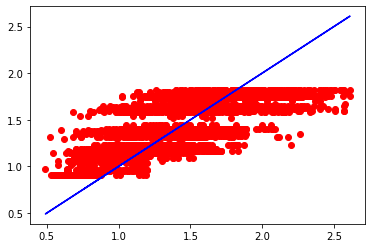

In [405]:
#calling hypertuned Ridge model
eval(h_adr)

In [412]:
#with trial and error changing the parameters values from the parameters  we are able to increase the accuracy.So choosing the n_estimators as 56 for imporving the model accuracy.
h_adr=AdaBoostRegressor(base_estimator=None,n_estimators=56,learning_rate=0.7100000000000001,loss='linear',random_state=None)

AdaBoostRegressor(learning_rate=0.7100000000000001, n_estimators=56)
r2_score for train data is 56.01%


r2_score for  test data is  56.56%


Error
mean absolute error :  0.20637963563173298
mean squared error :  0.06606954343289495
mean squared error is:  0.2570399646609355


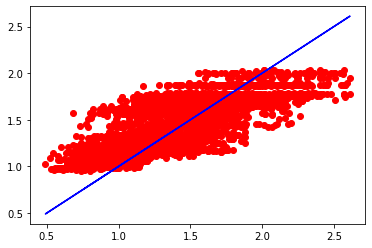

In [413]:
#calling hypertuned Ridge model
eval(h_adr)

# with hypertuning the models accuracy is increasing from 56.19 to 56.56,the increase in the accuracy is low with hypertuning.
we will go with AdaBoostRegressor  model  with hypertuning .

In [415]:
#saving the model
joblib.dump(h_adr,"Baseball_Case_Study_avg_price.obj")

['Baseball_Case_Study_avg_price.obj']

In [416]:
#Lets Check loading the file 

Avg_price_predicted_wins=joblib.load("Baseball_Case_Study_avg_price.obj")

In [417]:
pred=h_adr.predict(x_test)
Conclusion=pd.DataFrame([Avg_price_predicted_wins.predict(x_test)[:],pred[:]],index=["Predicted","Original"])
Conclusion

0         1         2         3        4         5     \
Predicted  1.060265  1.247172  1.299537  1.164954  1.75235  1.672648   
Original   1.060265  1.247172  1.299537  1.164954  1.75235  1.672648   

               6         7         8         9         10        11    \
Predicted  1.171158  1.146644  1.175765  1.153612  1.427487  1.782481   
Original   1.171158  1.146644  1.175765  1.153612  1.427487  1.782481   

               12        13        14        15        16        17    \
Predicted  1.178843  1.864851  1.299537  1.200331  1.766828  1.328462   
Original   1.178843  1.864851  1.299537  1.200331  1.766828  1.328462   

               18        19        20        21        22       23    \
Predicted  1.065743  1.758897  1.681687  1.672648  1.713918  1.43841   
Original   1.065743  1.758897  1.681687  1.672648  1.713918  1.43841   

               24       25       26        27        28        29        30    \
Predicted  1.450759  1.07133  1.36591  1.107512  1.611526  1.450759  1.758897   
Original   1.450759  1.07133  1.36591  1.107512  1.611526  1.450759  1.758897   

               31        32        33        34        35      36        37    \
Predicted  1.143927  1.681687  1.228393  1.864851  1.787531  1.1954  1.160859   
Original   1.143927  1.681687  1.228393  1.864851  1.787531  1.1954  1.160859   

               38        39        40        41        42        43    \
Predicted  1.864851  1.871347  1.864851  2.005793  1.206257  1.355304   
Original   1.864851  1.871347  1.864851  2.005793  1.206257  1.355304   

               44        45        46        47      48        49        50    \
Predicted  1.160859  1.758897  1.591943  1.760236  1.1954  1.787531  1.328462   
Original   1.160859  1.758897  1.591943  1.760236  1.1954  1.787531  1.328462   

               51        52        53        54        55        56    \
Predicted  1.719766  1.117859  1.164954  1.731326  1.713918  1.139724   
Original   1.719766  1.117859  1.164954  1.731326  1.713918  1.139724   

               57        58        59        60       61        62      63    \
Predicted  1.560667  1.722324  1.159182  1.713918  1.75235  1.766828  1.1954   
Original   1.560667  1.722324  1.159182  1.713918  1.75235  1.766828  1.1954   

               64       65       66        67        68        69        70    \
Predicted  1.864851  1.19708  1.75235  1.160859  1.710394  1.561921  1.164954   
Original   1.864851  1.19708  1.75235  1.160859  1.710394  1.561921  1.164954   

               71        72        73        74        75        76    \
Predicted  1.311149  1.953764  1.138045  1.054466  1.107512  1.200331   
Original   1.311149  1.953764  1.138045  1.054466  1.107512  1.200331   

               77        78        79        80        81        82    \
Predicted  1.562696  1.160859  1.450759  1.562696  1.459614  1.610061   
Original   1.562696  1.160859  1.450759  1.562696  1.459614  1.610061   

               83       84        85        86        87        88    \
Predicted  1.299537  1.32662  1.562696  1.705548  1.469686  1.164954   
Original   1.299537  1.32662  1.562696  1.705548  1.469686  1.164954   

               89        90        91        92        93        94    \
Predicted  1.244666  1.206257  1.683265  1.242504  1.482787  1.234658   
Original   1.244666  1.206257  1.683265  1.242504  1.482787  1.234658   

               95        96        97        98        99        100   \
Predicted  1.317394  1.338808  1.713918  1.618468  1.241473  1.735785   
Original   1.317394  1.338808  1.713918  1.618468  1.241473  1.735785   

              101       102       103       104       105       106   \
Predicted  1.75235  1.338808  1.570549  1.244666  1.144109  1.427487   
Original   1.75235  1.338808  1.570549  1.244666  1.144109  1.427487   

               107      108       109       110       111       112   \
Predicted  1.175765  1.16294  1.636718  1.184959  1.897559  1.672648   
Original   1.175765  1.162

The datas predicted are perfectly matching. The jobfile created is working well .

In [ ]:
After Training and Testing 8 algorithm model, The best accuracy model was determined as AdaBoostRegressor with 56.56% true accuracy after all the data cleaning, pre-processing, training and prediction as well as evaluation phase